In [1]:
import matplotlib as mpl
import cartopy.crs as ccrs
from cartopy.io.img_tiles import Stamen
from netCDF4 import Dataset, num2date
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
from matplotlib import cm
import datetime
# import nc_time_axis
# from cftime import DatetimeNoLeap
import numpy as np
import xarray as xr
from flox.xarray import xarray_reduce
import dask
from dask.diagnostics import ProgressBar
# from braceexpand import braceexpand
import pandas as pd
from math import cos, asin, sqrt, pi
%matplotlib inline
%config InlineBackend.figure_format='retina'
# This code make the next section of code to stop acting silly
dask.config.set({"array.slicing.split_large_chunks": True})
	# True: smaller chunks are used
	# False: large chunks are accepted

#### Functions

In [2]:
# Purpose: Create a LocalTime coordinate within your DataArray.

# Input:
    # da = xr.DataArray;  Must be in shape: time x south_north x west_east
		# Make sure west_east/XLONG values are 0->360, not -180->+180
	# dim_num = 2 or 3;  This indicates to the function if you want Local Time
		# within the dataarray to be only a function of time and longitude, or
		# time, lognitude, and latitude. This is a preference and if you don't need
		# it as a function of latitude, it will save lots of time going with dim_num = 2.
# Output:
    # da: This will be the DataArray with the newly assigned coordinate
# Process:
    # First create a matrix of hours to be offset relative to UTC.
    # Create an empty array that has dimensions Time and Longitude.
    # Loop through each timestep and longitude to determine the local time.
    # Assign the new Local Time coordinate to the da and return it.


def assign_LT_coord(da, dim_num):
	hour_offset = (da.lon.values/15).round(decimals=0)

	# Local Time is a function of only Time and Longitude
	if dim_num==2:
		local_time = np.empty([len(da.time),len(da.lon)], dtype=object)
		for i in range(local_time.shape[0]):
			for j in range(local_time.shape[1]):
				local_time[i,j] = da.time.values[i] + np.timedelta64(int(hour_offset[j]),'h')
		da = da.assign_coords(LocalTime=(('time','lon'),local_time))
	
	# Local Time is a function of Time, Longitude, and Latitude
	else:
		local_time = np.empty([len(da.time),len(da.lat),len(da.lon)], dtype='datetime64[ns]')
		for i in range(local_time.shape[0]):
			for j in range(local_time.shape[2]):
				local_time[i,:,j] = da.time.values[i] + np.timedelta64(int(hour_offset[j]),'h')
		da = da.assign_coords(LocalTime=(('time','lat','lon'),local_time))
	return da


In [3]:
def hov_diurnal(da):
    # Average over the bounds to create shape of (time,west_east)
    da_avg = da.where((da.lat>lat_avg_bound[0])&(da.lat<lat_avg_bound[1]),drop=True).mean(dim='lat')
    # Create a np.array with shape (west_east,hour). Then populate each longitude column with its respective
        # diurnal cycle of rain rate.
    array = np.zeros((da_avg.shape[1],24))
    # Loop through each longitude, look through all the timesteps and group them by hour,
        # and then average the values at each hour. Output the 1x24 array into the empty array
    for i in range(array.shape[0]):
        array[i,:] = da_avg[:,i].groupby('LocalTime.hour').mean()
    return array

In [4]:
# Purpose: Rotate a vectorized variable like a wind vector in x/lon and y/lat space!
	# See Lecture02_Vector.pdf in METR 5113 Advanced Atmospheric Dynamics folder

# Input:
    # da_x  = 		xr.data_array		 	# Should be the X component of the vector
    # da_y  = 		xr.data_array			# Should be the Y component of the vector
		# Can be one time step or pressure level or even a 4-D variable [Time x Height x Lat x Lon]
    # theta =		rotation in radians		
		# Must be -pi/2 < theta < pi/2, you don't need to rotate any more than the 180° provided
		# Positive theta indiates anticlockwise turn of coordinates
		# Negative theta indiates clockwise turn of coordinates
# Output:
    # da_x_rot:		da_x but rotated
	# da_y_rot:		da_y but rotated
# Process:
    # Check if theta is positive or negative
		# Based on the value, the projections using theta will change
	# Project the current x and y coordinate to the new rotated x and y coordinates for each component.
	# Once rotated, return the rotated x and y components
# Example:
	# da_x = da_d01_U
	# da_y = da_d01_V
	# theta = pi/4	# 45° rotation anti-clockwise
	# da_d01_U_rotated, da_d01_V_rotated = rotate_vec(da_x, da_y, theta)

def rotate_vec(da_x, da_y, theta):
	# anti-clockwise rotation
	if theta > 0:
		da_x_rot = da_x*cos(theta) + da_y*cos((pi/2)-theta)
		da_y_rot = da_x*cos((pi/2)-theta) + da_y*cos(theta)
	# clockwise rotation
	if theta < 0:
		da_x_rot = da_x*cos(-theta) + da_y*cos((pi/2)+theta)
		da_y_rot = da_x*cos((pi/2)+theta) + da_y*cos(-theta)

	return da_x_rot, da_y_rot

In [5]:
# Purpose: Create an array with multiple cross-sectional data from WRFoutput.
# Input:
    # da = 			xr.data_array		 	works with both 2-D and 3-D variables!
    # start_coord = [latitude, longitude] 
    # end_coord = 	[latitude, longitude]
	# width = 		spread of cross-section in degrees i.e., 0.75° = 0.75
	# dx = 			distance between each cross-sectional line i.e., 0.05° = 0.05
# Output:
    # da_cross: 		matrix in time, height, distance, and # of lines
		# 					or time, distance, and # of lines if using a 2-D variable
	# all_line_coords:	
# Process:
	# Make sure you 'da' have assigned coordinates corresponding to south_north and west_east.
    # We first create a main line between start_coord -> end_coord. This line will be the center
		# line for all other lines to sit next to.
	# Depending on the angle of the line (more latitudinal change or longitudinal change), this
		# function will account for that and make the longest side the length of the cross-sectional line
	# We then create an empty np.array, calculate the change in spread needed, then start filling in the data.

def cross_section_multi(da, start_coord, end_coord, width, dx):

	# We want to first create a line between start and end_coords
		# Gather the indicies of the closest gridboxes of start and end_coords.
	start_ilat = int((abs((da.lat) - (start_coord[0]))).argmin())
	end_ilat = int((abs((da.lat) - (end_coord[0]))).argmin())
	start_ilon = int((abs((da.lon) - (start_coord[1]))).argmin())
	end_ilon = int((abs((da.lon) - (end_coord[1]))).argmin())
	# This statement ensures that the length of the line will be the size of the LONGEST side (either lat or lon)
	if abs(start_ilat-end_ilat)>=abs(start_ilon-end_ilon):
		line_coords = np.zeros([2,abs(start_ilat-end_ilat)])
		# Populate latitudes
		line_coords[0,:] = np.linspace(da.lat[start_ilat], da.lat[end_ilat], abs(start_ilat-end_ilat))
		# Populate longitudes
		line_coords[1,:] = np.linspace(da.lon[start_ilon], da.lon[end_ilon], abs(start_ilat-end_ilat))
	else:
		line_coords = np.zeros([2,abs(start_ilon-end_ilon)])
		# Populate latitudes
		line_coords[0,:] = np.linspace(da.lat[start_ilat], da.lat[end_ilat], abs(start_ilon-end_ilon))
		# Populate longitudes
		line_coords[1,:] = np.linspace(da.lon[start_ilon], da.lon[end_ilon], abs(start_ilon-end_ilon))

	##########################################################################################################################
	# Now that we have the coordinates between the start and end_coords, we need to replicate it for all the lines
	num_lines = int(width/dx)
	spread = np.arange(width/2,-width/2,-dx)
	if 'bottom_top' in da.dims:	# If the dataset is 3-D
		#						TIME	x	HEIGHT	x	   DISTANCE	   x   #ofLINES
		da_cross = np.zeros([da.shape[0],da.shape[1],line_coords.shape[1],num_lines])
	else:
		#						TIME	x	   DISTANCE	   x   #ofLINES
		da_cross = np.zeros([da.shape[0],line_coords.shape[1],num_lines])

	# Create all_line_coords that holds all the coordinates for every line produced
	all_line_coords = np.zeros([line_coords.shape[0],line_coords.shape[1],spread.shape[0]])

	# Looping over all the lines
	for i in range(len(spread)):
		
		# Fix this part
		if (end_coord[0] > start_coord[0]):
			all_line_coords[0,:,i] = line_coords[0,:]+spread[i]
		else:
			all_line_coords[0,:,i] = line_coords[0,:]-spread[i]
		if (end_coord[1] > start_coord[1]):
			all_line_coords[1,:,i] = line_coords[1,:]-spread[i]
		else:
			all_line_coords[1,:,i] = line_coords[1,:]+spread[i]

		# Now that we have our lines, we can interpolate the dataset with the offset for each line applied
		da_interp = da.interp(lat=all_line_coords[0,:,i], lon=all_line_coords[1,:,i], method="linear")

		# Populate the new data array with data from the cross section
			# Loop through the length of the line, find the match, and then populate it.
		if 'bottom_top' in da.dims:	# If the dataset is 3-D
			for j in range(da_cross.shape[2]):
				data = da_interp.sel(
					lat = da_interp.lat[j],
					lon = da_interp.lon[j])
				da_cross[:,:,j,i] = data
		else:
			for j in range(da_cross.shape[1]):
				data = da_interp.sel(
					lat = da_interp.lat[j],
					lon = da_interp.lon[j])
				da_cross[:,j,i] = data

	return da_cross, all_line_coords

In [6]:
def dist(lat1, lon1, lat2, lon2):
    r = 6371 # km
    p = pi / 180

    a = 0.5 - cos((lat2-lat1)*p)/2 + cos(lat1*p) * cos(lat2*p) * (1-cos((lon2-lon1)*p))/2
    return 2 * r * asin(sqrt(a))

In [7]:
# Purpose: To alliviate the memory issue that arrises when you getvar() a big dataset.
# Input:
    # xrDataset = xr.open_dataset(filepath)
    # Dataset = Dataset(filepath)
    # varname = '<variablename>'
# Output:
    # da: This will be the xr.DataArray you are after
# Process:
    # First create an empty np.array that holds varname values.
    # Loop through each timestep to fill in the np.array.
    # Here's the trick, only getvar() one timestep, then expand the time dim.
        # This will repeate the values from the first timestep into the Time dim.
    # Assign the Time coordinates.
    # Replace the repeated values with the correct values from npArray.

# This method is ~6x more efficient than getvar(Dataset, varname, ALL_TIMES)

def wrf_np2da(xrDataset,Dataset,varname):
    da_times = getvar(Dataset, 'times', ALL_TIMES)			# Times in datetime64
    # Create empty numpy array
    npArray = np.empty((xrDataset.dims['Time'],xrDataset.dims['bottom_top'],
                        xrDataset.dims['south_north'],xrDataset.dims['west_east']),np.float32)
    for i in range(npArray.shape[0]):
        npArray[i,...] = getvar(Dataset, varname, timeidx=i, meta=False)
    da = getvar(Dataset, varname, timeidx=0)
    da = da.expand_dims(dim={'Time': da_times}, axis=0)
    da = da.assign_coords(dict(
        Time=('Time',da_times.values),
        XTIME=('Time',np.float32(xrDataset['ITIMESTEP'].values))
    ))
    da.values = npArray
    return da

In [8]:
def da_info(da):
    print('Description: ', da.description, '\nUnits: ',da.units, '\nDimensions: ', da.dims, '\nShape: ', da.shape)

In [9]:
# To slice and save .nc files

def slice_and_save_netcdf(files, lats, lons, times, output_dir):
	"""
	Slices and saves NetCDF files for a specified spatial and temporal range.

	Parameters:
	files (str or list of str): Path(s) to the input NetCDF file(s).
	latitude (list): Latitude range [min_lat, max_lat].
	longitude (list): Longitude range [min_lon, max_lon].
	times (list): Time range [start_time, end_time] in string format.
	output_dir (str): Directory where sliced files will be saved.

	"""
	# Open dataset
	ds = xr.open_mfdataset(files)
	
	# Slice dataset
	ds = ds.sel(
		lat=slice(lats[0],lats[1]),
		lon=slice(lons[0],lons[1]),
		time=slice(times[0],times[1]))

	# Save
	ds.to_netcdf(path=output_dir, mode='w', format='NETCDF4', unlimited_dims='time', compute=True)

	return

#### Save Data

In [10]:
# ## Novermber 23 - December 3, 2015
# files = ['/ourdisk/hpc/radclouds/auto_archive_notyet/tape_2copies/hragnajarian/obs_data/imerg.v7b.201511.nc4',
# 		'/ourdisk/hpc/radclouds/auto_archive_notyet/tape_2copies/hragnajarian/obs_data/imerg.v7b.201512.nc4']
# lats = [-10, 10]
# lons = [90, 125]
# times = ['2015-11-23 00:00','2015-12-03 00:00']
# output_dir = '/ourdisk/hpc/radclouds/auto_archive_notyet/tape_2copies/hragnajarian/obs_data/IMERG_2015-11-23-00:00-12-03-00:00.nc'
# slice_and_save_netcdf(files, lats, lons, times, output_dir)


#### Load Data

In [11]:
## IMERG rainfall rates just for specific dates
IMERG_filename_old = '/ourdisk/hpc/radclouds/auto_archive_notyet/tape_2copies/hragnajarian/obs_data/IMERG_2015-11-23-00:00-12-03-00:00.nc'
# IMERG_filename = '/ourdisk/hpc/radclouds/auto_archive_notyet/tape_2copies/hragnajarian/obs_data/IMERG_2015-12-01-00:00-12-10-00:00.nc'
IMERG_filename_new = '/ourdisk/hpc/radclouds/auto_archive_notyet/tape_2copies/hragnajarian/obs_data/IMERG_2015-12-10-00:00-12-20-00:00.nc'
# IMERG_filename = '/ourdisk/hpc/radclouds/auto_archive_notyet/tape_2copies/hragnajarian/obs_data/IMERG_2015-12-15-00:00-12-25-00:00.nc'
# IMERG_filename = '/ourdisk/hpc/radclouds/auto_archive_notyet/tape_2copies/hragnajarian/obs_data/IMERG_2015-12-20-00:00-12-30-00:00.nc'

lat_bound = [-10,10]	# South to North
lon_bound = [90,125]	# West to East

ds_RR_IMERG_old = xr.open_dataset(IMERG_filename_old)
ds_RR_IMERG_new = xr.open_dataset(IMERG_filename_new)
## Change coordinates from +-180° to 0-360°
ds_RR_IMERG_old = ds_RR_IMERG_old.assign_coords(lon=(ds_RR_IMERG_old.lon % 360)).sortby('lon')
ds_RR_IMERG_new = ds_RR_IMERG_new.assign_coords(lon=(ds_RR_IMERG_new.lon % 360)).sortby('lon')

da_RR_IMERG_old = ds_RR_IMERG_old['precipitation'].sel(lon=slice(lon_bound[0],lon_bound[1]),lat=slice(lat_bound[0],lat_bound[1])).compute()
da_RR_IMERG_new = ds_RR_IMERG_new['precipitation'].sel(lon=slice(lon_bound[0],lon_bound[1]),lat=slice(lat_bound[0],lat_bound[1])).compute()

## Change to times for IMERG data to datetime
	# https://stackoverflow.com/questions/55786995/converting-cftime-datetimejulian-to-datetime
datetimeindex = da_RR_IMERG_old.indexes['time'].to_datetimeindex()
da_RR_IMERG_old = da_RR_IMERG_old.assign_coords(time=datetimeindex)
da_RR_IMERG_old = da_RR_IMERG_old.transpose('time','lat','lon')
da_RR_IMERG_old = assign_LT_coord(da_RR_IMERG_old, dim_num=3)
print('This is the size of the IMERG data array in (time,lat,lon): ', da_RR_IMERG_old.shape)

## Change to times for IMERG data to datetime
# https://stackoverflow.com/questions/55786995/converting-cftime-datetimejulian-to-datetime
datetimeindex = da_RR_IMERG_new.indexes['time'].to_datetimeindex()
da_RR_IMERG_new = da_RR_IMERG_new.assign_coords(time=datetimeindex)
da_RR_IMERG_new = da_RR_IMERG_new.transpose('time','lat','lon')
da_RR_IMERG_new = assign_LT_coord(da_RR_IMERG_new, dim_num=3)
print('This is the size of the IMERG data array in (time,lat,lon): ', da_RR_IMERG_new.shape)

## IMERG Land-Sea Mask
# The file displays percent water surface coverage with 100% = all water and 0% = all land.
# Land sea is also called land ocean or land water. 
# Typical percentage thresholds used to define sea are 100% (strictly open water) 
	# or 75% (including sea-ward coast areas). 
# Typical percentages used to define strictly land are 25% or 15%; 
	# too low a percentage masks out humid regions that have many lakes and reservoirs.

ds_Mask_IMERG_old = xr.open_dataset('/ourdisk/hpc/radclouds/auto_archive_notyet/tape_2copies/hragnajarian/obs_data/IMERG_land_sea_mask.nc')
# Change coordinates from +-180° to 0-360°
ds_Mask_IMERG_old = ds_Mask_IMERG_old.assign_coords(lon=(ds_Mask_IMERG_old.lon % 360)).sortby('lon')
da_Mask_IMERG_old = ds_Mask_IMERG_old['landseamask'].sel(
    lon=slice(lon_bound[0],lon_bound[1]),
	lat=slice(lat_bound[0],lat_bound[1])
).compute()
# Repeat it so that a time dimension is added
x = da_Mask_IMERG_old.values.repeat(len(da_RR_IMERG_old.time)).reshape((len(da_Mask_IMERG_old.lat),
                                                            len(da_Mask_IMERG_old.lon),
                                                            len(da_RR_IMERG_old.time)))
x = np.transpose(x, (2,0,1))
da_Mask_IMERG_old = xr.DataArray(
    data = x,
    dims = ['time','lat','lon'],
    coords = dict(
        lat=('lat',da_RR_IMERG_old.lat.values),
        lon=('lon',da_RR_IMERG_old.lon.values),
        time=('time',da_RR_IMERG_old.time.values)
        ))

ds_Mask_IMERG_new = xr.open_dataset('/ourdisk/hpc/radclouds/auto_archive_notyet/tape_2copies/hragnajarian/obs_data/IMERG_land_sea_mask.nc')
# Change coordinates from +-180° to 0-360°
ds_Mask_IMERG_new = ds_Mask_IMERG_new.assign_coords(lon=(ds_Mask_IMERG_new.lon % 360)).sortby('lon')
da_Mask_IMERG_new = ds_Mask_IMERG_new['landseamask'].sel(
    lon=slice(lon_bound[0],lon_bound[1]),
	lat=slice(lat_bound[0],lat_bound[1])
).compute()
# Repeat it so that a time dimension is added
x = da_Mask_IMERG_new.values.repeat(len(da_RR_IMERG_new.time)).reshape((len(da_Mask_IMERG_new.lat),
                                                            len(da_Mask_IMERG_new.lon),
                                                            len(da_RR_IMERG_new.time)))
x = np.transpose(x, (2,0,1))
da_Mask_IMERG_new = xr.DataArray(
    data = x,
    dims = ['time','lat','lon'],
    coords = dict(
        lat=('lat',da_RR_IMERG_new.lat.values),
        lon=('lon',da_RR_IMERG_new.lon.values),
        time=('time',da_RR_IMERG_new.time.values)
        ))

# Create a diurnal mask too
da_di_Mask_IMERG_old = da_Mask_IMERG_old[:48].rename({'time': 'hour'})
da_di_Mask_IMERG_old = da_di_Mask_IMERG_old.assign_coords(hour=np.arange(0,24,0.5))
da_di_Mask_IMERG_new = da_Mask_IMERG_new[:48].rename({'time': 'hour'})
da_di_Mask_IMERG_new = da_di_Mask_IMERG_new.assign_coords(hour=np.arange(0,24,0.5))

/tmp/ipykernel_1009/1379522709.py:22: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'julian', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  datetimeindex = da_RR_IMERG_old.indexes['time'].to_datetimeindex()


This is the size of the IMERG data array in (time,lat,lon):  (481, 200, 350)


/tmp/ipykernel_1009/1379522709.py:30: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'julian', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  datetimeindex = da_RR_IMERG_new.indexes['time'].to_datetimeindex()


This is the size of the IMERG data array in (time,lat,lon):  (481, 200, 350)


#### Domain Analysis

Time Series

(0.0, 1.5)

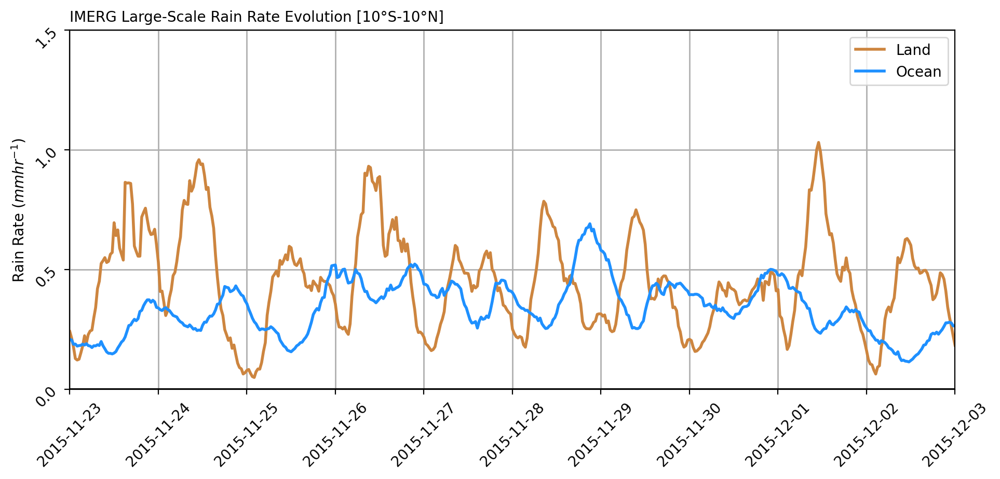

In [23]:
fig = plt.figure(figsize=(11,4.5))
ax1 = fig.add_subplot()

# Land
l1 = xr.where(da_Mask_IMERG_old<25, da_RR_IMERG_old, np.nan).mean(dim=['lat','lon']).plot.line(
    ax=ax1,
    color='peru',
    linewidth=2,
    linestyle = '-',
	label='Land'
)

l2 = xr.where(da_Mask_IMERG_old>=25, da_RR_IMERG_old, np.nan).mean(dim=['lat','lon']).plot.line(
    ax=ax1,
    color='dodgerblue',
    linewidth=2,
    linestyle = '-',
	label='Ocean'
)

plt.axhline(y = 0, color = 'k', linestyle = '-')

ax1.grid(linestyle='-', axis='x', linewidth=1)
ax1.grid(linestyle='-', axis='y', linewidth=1)
# Set titles/labels
ax1.set_title(f'IMERG Large-Scale Rain Rate Evolution [{abs(lat_bound[0])}°S-{lat_bound[1]}°N]', loc='left', fontsize=10)
ax1.set_title('')
ax1.set_yticks(np.arange(0,4,.5))
ax1.tick_params(rotation=45)
ax1.set_xticks(da_RR_IMERG_old.time[0::48])
ax1.set_xticklabels(np.array(da_RR_IMERG_old.time[0::48].dt.strftime("%Y-%m-%d")))
ax1.set_xlabel('')
ax1.set_ylabel('Rain Rate ($mm hr^{-1}$)')
ax1.legend(loc='upper right')
ax1.set_xlim([da_RR_IMERG_old.time[0],da_RR_IMERG_old.time[-1]])
ax1.set_ylim([0,1.5])


(0.0, 1.5)

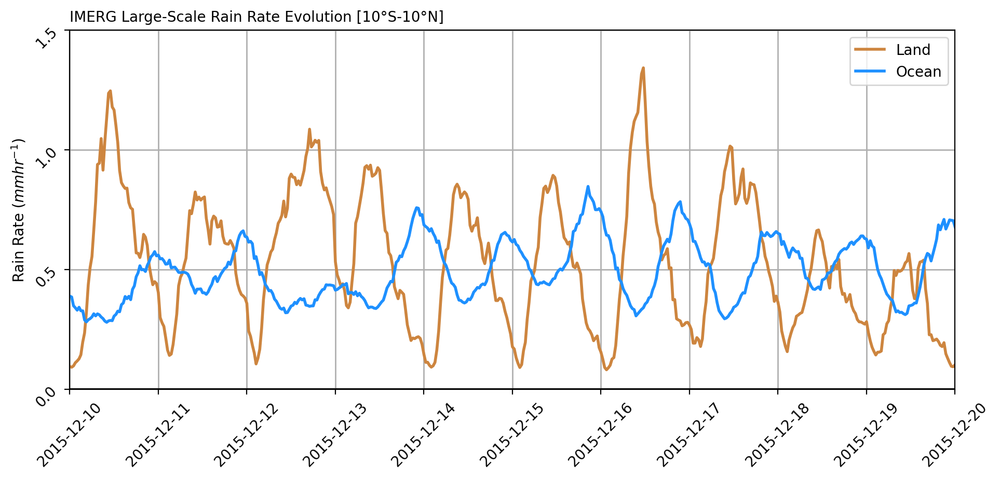

In [24]:
fig = plt.figure(figsize=(11,4.5))
ax1 = fig.add_subplot()

# Land
l1 = xr.where(da_Mask_IMERG_new<25, da_RR_IMERG_new, np.nan).mean(dim=['lat','lon']).plot.line(
    ax=ax1,
    color='peru',
    linewidth=2,
    linestyle = '-',
	label='Land'
)

l2 = xr.where(da_Mask_IMERG_new>=25, da_RR_IMERG_new, np.nan).mean(dim=['lat','lon']).plot.line(
    ax=ax1,
    color='dodgerblue',
    linewidth=2,
    linestyle = '-',
	label='Ocean'
)

plt.axhline(y = 0, color = 'k', linestyle = '-')

ax1.grid(linestyle='-', axis='x', linewidth=1)
ax1.grid(linestyle='-', axis='y', linewidth=1)
# Set titles/labels
ax1.set_title(f'IMERG Large-Scale Rain Rate Evolution [{abs(lat_bound[0])}°S-{lat_bound[1]}°N]', loc='left', fontsize=10)
ax1.set_title('')
ax1.set_yticks(np.arange(0,4,.5))
ax1.tick_params(rotation=45)
ax1.set_xticks(da_RR_IMERG_new.time[0::48])
ax1.set_xticklabels(np.array(da_RR_IMERG_new.time[0::48].dt.strftime("%Y-%m-%d")))
ax1.set_xlabel('')
ax1.set_ylabel('Rain Rate ($mm hr^{-1}$)')
ax1.legend(loc='upper right')
ax1.set_xlim([da_RR_IMERG_new.time[0],da_RR_IMERG_new.time[-1]])
ax1.set_ylim([0,1.5])


Diurnal Composite

In [13]:
## Diurnal Composite of Rain Rate over the MC

## Old dates

# Create a new named DataArray for decimal hours
decimal_hour = (da_RR_IMERG_old.LocalTime.dt.hour + da_RR_IMERG_old.LocalTime.dt.minute / 60).rename('hour')

	# Land
RR_land_old = xarray_reduce(da_RR_IMERG_old.where(da_Mask_IMERG_old<75), decimal_hour, func='nanmean', expected_groups=(np.arange(0,24,0.5)), isbin=[False], fill_value=np.nan)
RR_land_old = xr.concat([RR_land_old,RR_land_old[0]], dim='hour').assign_coords(hour=np.arange(0,24.5,0.5))
	# Ocean
RR_ocean_old = xarray_reduce(da_RR_IMERG_old.where(da_Mask_IMERG_old>=75), decimal_hour, func='nanmean', expected_groups=(np.arange(0,24,0.5)), isbin=[False], fill_value=np.nan)
RR_ocean_old = xr.concat([RR_ocean_old,RR_ocean_old[0]], dim='hour').assign_coords(hour=np.arange(0,24.5,0.5))
	# Net
RR_net_old = xarray_reduce(da_RR_IMERG_old, decimal_hour, func='nanmean', expected_groups=(np.arange(0,24,0.5)), isbin=[False], fill_value=np.nan)
RR_net_old = xr.concat([RR_net_old,RR_net_old[0]], dim='hour').assign_coords(hour=np.arange(0,24.5,0.5))

## Spatial Diurnal Composite
RR_di_old = xarray_reduce(da_RR_IMERG_old, decimal_hour, func='nanmean', dim='time', expected_groups=np.arange(0, 24, 0.5), isbin=[False], fill_value=np.nan).transpose('hour', 'lat', 'lon')
# RR_di_old = xarray_reduce(da_RR_IMERG_old, 'LocalTime.hour', func='nanmean', dim='time', expected_groups=(np.arange(0,24)), isbin=[False]).transpose('hour','lat','lon')
RR_di_land_old = xr.where(da_di_Mask_IMERG_old<75, RR_di_old, np.nan)
RR_di_ocean_old = xr.where(da_di_Mask_IMERG_old>=75, RR_di_old, np.nan)

# Find the max and min values
max_RR_di_old = RR_di_old.max(dim='hour', keep_attrs=True)
min_RR_di_old = RR_di_old.min(dim='hour', keep_attrs=True)
max_RR_di_land_old = xr.where(da_Mask_IMERG_old<75, max_RR_di_old, np.nan)
max_RR_di_ocean_old = xr.where(da_Mask_IMERG_old>=75, max_RR_di_old, np.nan)

# Find the diurnal range (max-min)
range_RR_di_old = max_RR_di_old-min_RR_di_old
range_RR_di_land_old = xr.where(da_Mask_IMERG_old<75, range_RR_di_old, np.nan)
range_RR_di_ocean_old = xr.where(da_Mask_IMERG_old>=75, range_RR_di_old, np.nan)




## New dates

# Create a new named DataArray for decimal hours
decimal_hour = (da_RR_IMERG_new.LocalTime.dt.hour + da_RR_IMERG_new.LocalTime.dt.minute / 60).rename('hour')

	# Land
RR_land_new = xarray_reduce(da_RR_IMERG_new.where(da_Mask_IMERG_new<75), decimal_hour, func='nanmean', expected_groups=(np.arange(0,24,0.5)), isbin=[False], fill_value=np.nan)
RR_land_new = xr.concat([RR_land_new,RR_land_new[0]], dim='hour').assign_coords(hour=np.arange(0,24.5,0.5))
	# Ocean
RR_ocean_new = xarray_reduce(da_RR_IMERG_new.where(da_Mask_IMERG_new>=75), decimal_hour, func='nanmean', expected_groups=(np.arange(0,24,0.5)), isbin=[False], fill_value=np.nan)
RR_ocean_new = xr.concat([RR_ocean_new,RR_ocean_new[0]], dim='hour').assign_coords(hour=np.arange(0,24.5,0.5))
	# Net
RR_net_new = xarray_reduce(da_RR_IMERG_new, decimal_hour, func='nanmean', expected_groups=(np.arange(0,24,0.5)), isbin=[False], fill_value=np.nan)
RR_net_new = xr.concat([RR_net_new,RR_net_new[0]], dim='hour').assign_coords(hour=np.arange(0,24.5,0.5))

## Spatial Diurnal Composite
RR_di_new = xarray_reduce(da_RR_IMERG_new, decimal_hour, func='nanmean', dim='time', expected_groups=np.arange(0, 24, 0.5), isbin=[False], fill_value=np.nan).transpose('hour', 'lat', 'lon')
# RR_di_new = xarray_reduce(da_RR_IMERG_new, 'LocalTime.hour', func='nanmean', dim='time', expected_groups=(np.arange(0,24)), isbin=[False]).transpose('hour','lat','lon')
RR_di_land_new = xr.where(da_di_Mask_IMERG_new<75, RR_di_new, np.nan)
RR_di_ocean_new = xr.where(da_di_Mask_IMERG_new>=75, RR_di_new, np.nan)

# Find the max and min values
max_RR_di_new = RR_di_new.max(dim='hour', keep_attrs=True)
min_RR_di_new = RR_di_new.min(dim='hour', keep_attrs=True)
max_RR_di_land_new = xr.where(da_Mask_IMERG_new<75, max_RR_di_new, np.nan)
max_RR_di_ocean_new = xr.where(da_Mask_IMERG_new>=75, max_RR_di_new, np.nan)

# Find the diurnal range (max-min)
range_RR_di_new = max_RR_di_new-min_RR_di_new
range_RR_di_land_new = xr.where(da_Mask_IMERG_new<75, range_RR_di_new, np.nan)
range_RR_di_ocean_new = xr.where(da_Mask_IMERG_new>=75, range_RR_di_new, np.nan)

In [30]:
## Percentage Difference From PreMJO-to-MJO
	# Uses diurnal composite data that has been averaged over the domain (dims = [hours])

# Range
def percent_diff_range(mjo, premjo):
	mjo_range = mjo.max()-mjo.min()
	premjo_range = premjo.max()-premjo.min()
	return (((mjo_range-premjo_range)/premjo_range)*100).values

# Accumulated
def percent_diff_accum(mjo, premjo):
	return (((mjo.sum()-premjo.sum())/premjo.sum())*100).values

# Mean 
def percent_diff_mean(mjo, premjo, std):
	# Standardized difference in the mean w.r.t. to the premjo
		# This option provides a more relative comparison between variables, 
			# especially those who's differences are small, but magnitudes are large, resulting in a small % difference in the mean.
		# e.g. A value of 100 % suggest mjo mean is exactly 1 premjo std higher than the premjo mean. Negative % means the mjo mean is lower ...
	if std==True:
		return (((mjo.mean()-premjo.mean())/premjo.std())*100).values
	else:
		return (((mjo.mean()-premjo.mean())/premjo.mean())*100).values


In [39]:
range_ctrl_land = percent_diff_range(RR_land_new[:-1],RR_land_old[:-1]).round()
range_ctrl_ocean = percent_diff_range(RR_ocean_new[:-1],RR_ocean_old[:-1]).round()
std_var = False
mean_ctrl_land = percent_diff_mean(RR_land_new[:-1],RR_land_old[:-1], std=std_var).round()
mean_ctrl_ocean = percent_diff_mean(RR_ocean_new[:-1],RR_ocean_old[:-1], std=std_var).round()

data = [
	[range_ctrl_land,mean_ctrl_land],
	[range_ctrl_ocean,mean_ctrl_ocean],
]
if std_var: string='Standardized Mean Rainfall'
else: string='Mean Rainfall'
column_headers = pd.MultiIndex.from_tuples([
    ('% Difference From PreMJO-to-MJO','Rain Rate Range'),
    ('% Difference From PreMJO-to-MJO', string),
])

row_headers = pd.MultiIndex.from_tuples([
    ('Land',),
    ('Ocean',),
], names=['Surface Type'])

df = pd.DataFrame(data, columns=column_headers, index=row_headers)

print(df)

             % Difference From PreMJO-to-MJO              
                             Rain Rate Range Mean Rainfall
Surface Type                                              
Land                                    43.0          27.0
Ocean                                   58.0          44.0


In [25]:
print(f'Land/Ocean Ratio: {((da_Mask_IMERG_old<75).sum()/(da_Mask_IMERG_old>=75).sum()).values}')

Land/Ocean Ratio: 0.3324704001218259


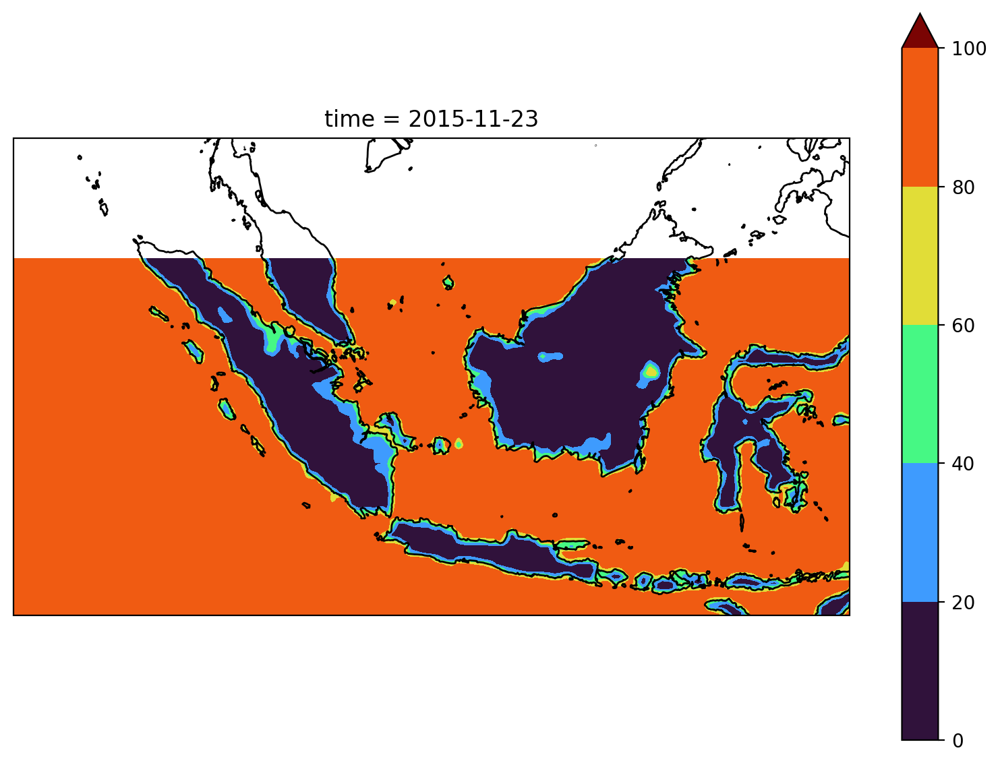

In [34]:
fig = plt.figure(figsize=(10,7))
gs = gridspec.GridSpec(nrows=1, ncols=1, hspace=0, wspace=0)
ax1 = fig.add_subplot(gs[0,0], projection=ccrs.PlateCarree(central_longitude=0))
da_Mask_IMERG_old[0].plot.contourf(
    ax=ax1,
    add_colorbar=True,
    cmap='turbo',
    # levels=np.arange(levels[0]-(dl/2),levels[1]+dl+(dl/2),dl),
    # vmin=levels[0], vmax=levels[1],
    x='lon',
    y='lat',
    extend='max',
    xlim=[lon_bound_temp[0], lon_bound_temp[1]],
    ylim=[lat_bound_temp[0], lat_bound_temp[1]],
)
ax1.coastlines(linewidth=1, color='k', resolution='10m')  # cartopy function

(0.05, 2.0)

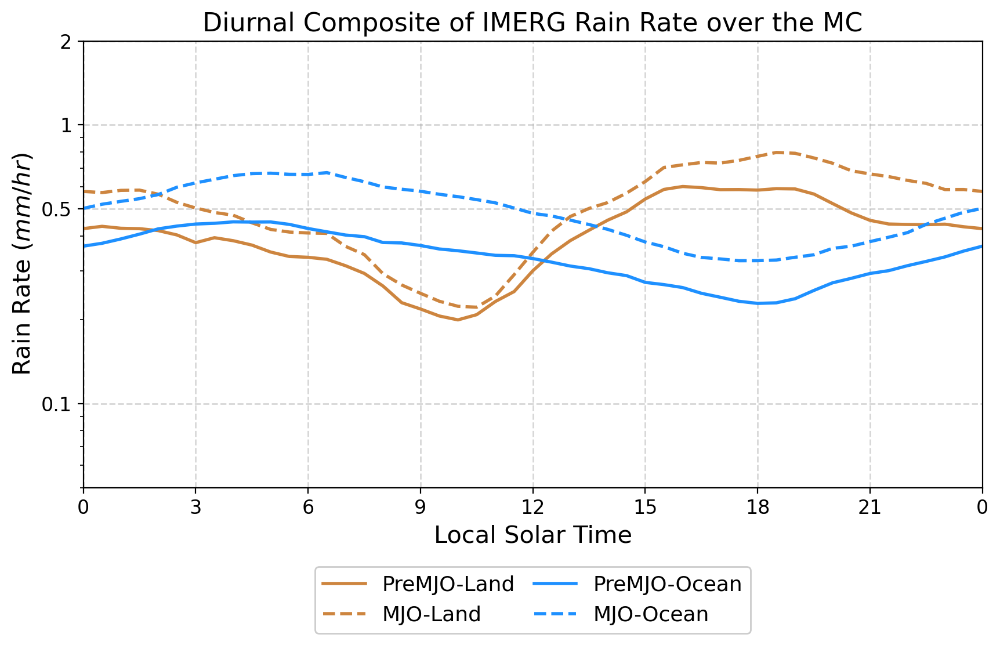

In [20]:
fig = plt.figure(figsize=(10,5))
gs = gridspec.GridSpec(nrows=1, ncols=1)

ax1 = fig.add_subplot(gs[0,:])

fs = 18

## PreMJO
l1 = RR_land_old.plot.line(
    ax=ax1,
    color='peru',
    linewidth=2,
    linestyle = '-',
	label='PreMJO-Land'
)
l4 = RR_land_new.plot.line(
    ax=ax1,
    color='peru',
    linewidth=2,
    linestyle = '--',
	label='MJO-Land'
)

l2 = RR_ocean_old.plot.line(
    ax=ax1,
    color='dodgerblue',
    linewidth=2,
    linestyle = '-',
	label='PreMJO-Ocean'
)
l5 = RR_ocean_new.plot.line(
    ax=ax1,
    color='dodgerblue',
    linewidth=2,
    linestyle = '--',
	label='MJO-Ocean'
)

# l3 = RR_net_old.plot.line(
#     ax=ax1,
#     color='k',
#     linewidth=2,
#     linestyle = '-',
# 	label='PreMJO-Net'
# )
# l6 = RR_net_new.plot.line(
#     ax=ax1,
#     color='k',
#     linewidth=2,
#     linestyle = '--',
# 	label='MJO-Net'
# )

ax1.set_yscale('log')
ax1.set_yticks(np.array([.1,0.5,1,2]))
ax1.set_xticks(np.arange(0,25,3))
# ax1.set_yticks(np.arange(0,3,.25))
title = 'Diurnal Composite of IMERG Rain Rate over the MC'
ax1.set_title(title, fontsize=fs-2)
# ax1.set_title('11/23 - 12/03', loc='right', fontsize=fs-10)
# ax1.set_title('12/01 - 12/10', loc='right', fontsize=fs-10)
# ax1.set_title('12/10 - 12/20', loc='right', fontsize=fs-10)
# ax1.set_title('12/15 - 12/25', loc='right', fontsize=fs-10)
# ax1.set_title('12/20 - 12/30', loc='right', fontsize=fs-10)
ax1.set_xlabel('Local Solar Time', fontsize=fs-3)
ax1.set_ylabel('Rain Rate ($mm/hr$)', fontsize=fs-3)
ax1.set_xticklabels(np.concatenate((np.arange(0,24,3),[0])), fontsize=fs-6)
# ax1.set_yticklabels(np.arange(0,3,.25), fontsize=fs-6)
ax1.set_yticklabels(np.array(['0.1','0.5','1','2']), fontsize=fs-6)
ax1.grid(linestyle='--', axis='x', linewidth=1, alpha=.5)
ax1.grid(linestyle='--', axis='y', linewidth=1, alpha=.5)
# ax1.axhline(y=0, color='k', linestyle='-', linewidth=1)
# ax1.legend(ncol=3, fontsize=fs-5, loc='upper center', framealpha=1, columnspacing=.92)
ax1.legend(ncol=2, fontsize=fs-5, loc='lower center', framealpha=1, columnspacing=.92, bbox_to_anchor=(.5,-0.35))
ax1.set_xlim([0,24])
# ax1.set_ylim([0,1])
ax1.set_ylim([.05,2])

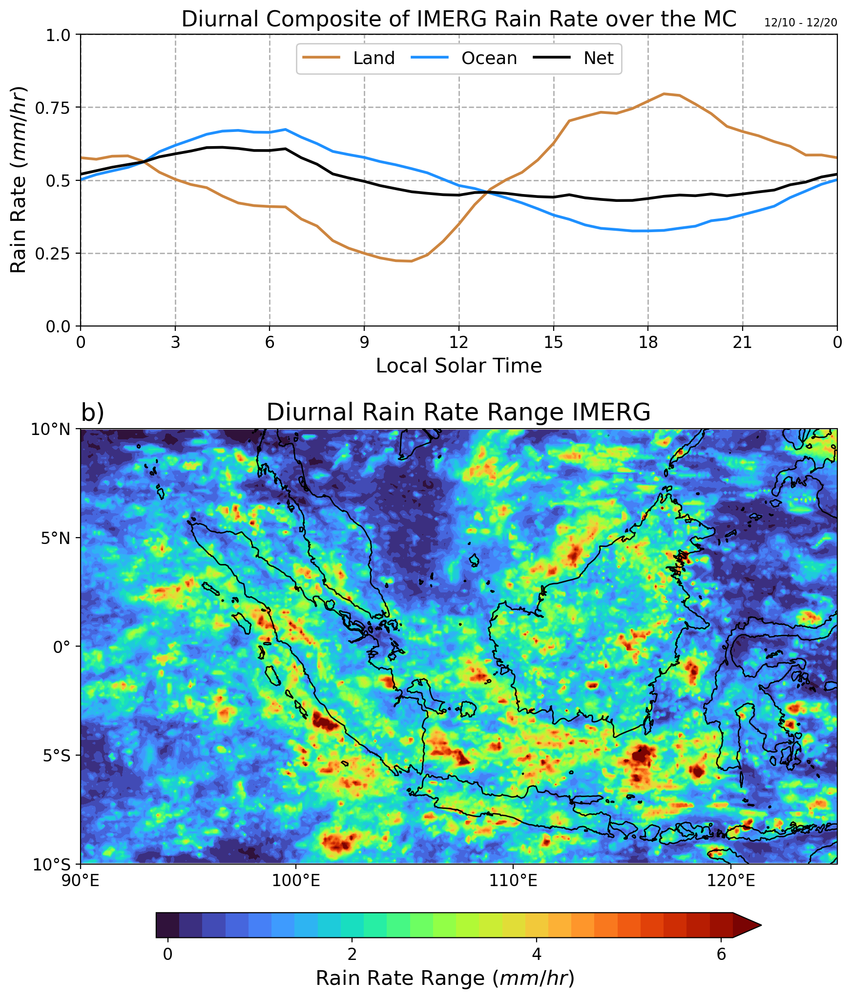

In [14]:
fig = plt.figure(figsize=(10,12))
gs = gridspec.GridSpec(nrows=5, ncols=3, hspace=0, wspace=0, height_ratios=[.35,.075,.62,.01,.03], width_ratios=[.1,.8,.1])

ax1 = fig.add_subplot(gs[0,:])

fs = 18

# RR-land
l1 = RR_land_new.plot.line(
    ax=ax1,
    color='peru',
    linewidth=2,
    linestyle = '-',
	label='Land'
)
l2 = RR_ocean_new.plot.line(
    ax=ax1,
    color='dodgerblue',
    linewidth=2,
    linestyle = '-',
	label='Ocean'
)
l3 = RR_net_new.plot.line(
    ax=ax1,
    color='k',
    linewidth=2,
    linestyle = '-',
	label='Net'
)

ax1.set_xticks(np.arange(0,25,3))
ax1.set_yticks(np.arange(0,3,.25))
title = 'Diurnal Composite of IMERG Rain Rate over the MC'
ax1.set_title(title, fontsize=fs-2)
# ax1.set_title('11/23 - 12/03', loc='right', fontsize=fs-10)
# ax1.set_title('12/01 - 12/10', loc='right', fontsize=fs-10)
ax1.set_title('12/10 - 12/20', loc='right', fontsize=fs-10)
# ax1.set_title('12/15 - 12/25', loc='right', fontsize=fs-10)
# ax1.set_title('12/20 - 12/30', loc='right', fontsize=fs-10)
ax1.set_xlabel('Local Solar Time', fontsize=fs-3)
ax1.set_ylabel('Rain Rate ($mm/hr$)', fontsize=fs-3)
ax1.set_xticklabels(np.concatenate((np.arange(0,24,3),[0])), fontsize=fs-6)
ax1.set_yticklabels(np.arange(0,3,.25), fontsize=fs-6)
ax1.grid(linestyle='--', axis='x', linewidth=1)
ax1.grid(linestyle='--', axis='y', linewidth=1)
ax1.axhline(y=0, color='k', linestyle='-', linewidth=1)
ax1.legend(ncol=3, fontsize=fs-5, loc='upper center', framealpha=1, columnspacing=.92)
ax1.set_xlim([0,24])
ax1.set_ylim([0,1])


ax2 = fig.add_subplot(gs[2,:], projection=ccrs.PlateCarree(central_longitude=0))

levels = [0, 6]
dl = .25
lon_bound_temp = [90,125]
lat_bound_temp = [-10,10]

# No significance shading
cf = range_RR_di_new.plot.contourf(
    ax=ax2,
    add_colorbar=False,
    cmap='turbo',
    levels=np.arange(levels[0]-(dl/2),levels[1]+dl+(dl/2),dl),
    vmin=levels[0], vmax=levels[1],
    x='lon',
    y='lat',
    extend='max',
    xlim=[lon_bound_temp[0], lon_bound_temp[1]],
    ylim=[lat_bound_temp[0], lat_bound_temp[1]],
)


# plot_cross_lines(all_line_coords1,all_line_coords2,all_line_coords3,ax=ax2)
# plot_cross_box(all_line_coords1,all_line_coords2,all_line_coords3,fs,alpha=.75,ax=ax2)

# Set parameters and labels
x_ticks = [90.1,100,110,120]
x_tick_labels = [u'90\N{DEGREE SIGN}E',
                 u'100\N{DEGREE SIGN}E', u'110\N{DEGREE SIGN}E',
                 u'120\N{DEGREE SIGN}E']
y_ticks = [-10,-5,0,5,10]
y_tick_labels = [u'10\N{DEGREE SIGN}S',u'5\N{DEGREE SIGN}S',
		 		u'0\N{DEGREE SIGN}',
				u'5\N{DEGREE SIGN}N',u'10\N{DEGREE SIGN}N']

# Plot the coast lines
ax2.coastlines(linewidth=1, color='k', resolution='10m')  # cartopy function

ax2.set_title('Diurnal Rain Rate Range IMERG', fontsize=fs, loc='center')
ax2.set_title('b)', loc='left', fontsize=fs)
ax2.set_xticks(x_ticks)
ax2.set_xticklabels(x_tick_labels, fontsize=fs-6)
ax2.set_yticks(y_ticks)
ax2.set_yticklabels(y_tick_labels, fontsize=fs-6)
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.set_xlim([90.1,124.9])

ax3 = fig.add_subplot(gs[4,1])
# cbar = plt.colorbar(cf, cax=ax3, orientation='horizontal', extend='both', ticks=np.arange(-10,12,2))
cbar = plt.colorbar(cf, cax=ax3, orientation='horizontal', extend='both', ticks=np.arange(levels[0],levels[1]+1,2))
cbar.set_ticklabels(np.arange(levels[0],levels[1]+1,2), fontsize=fs-6)
cbar.minorticks_off()
cbar.set_label('Rain Rate Range ($mm/hr$)', fontsize=fs-3)

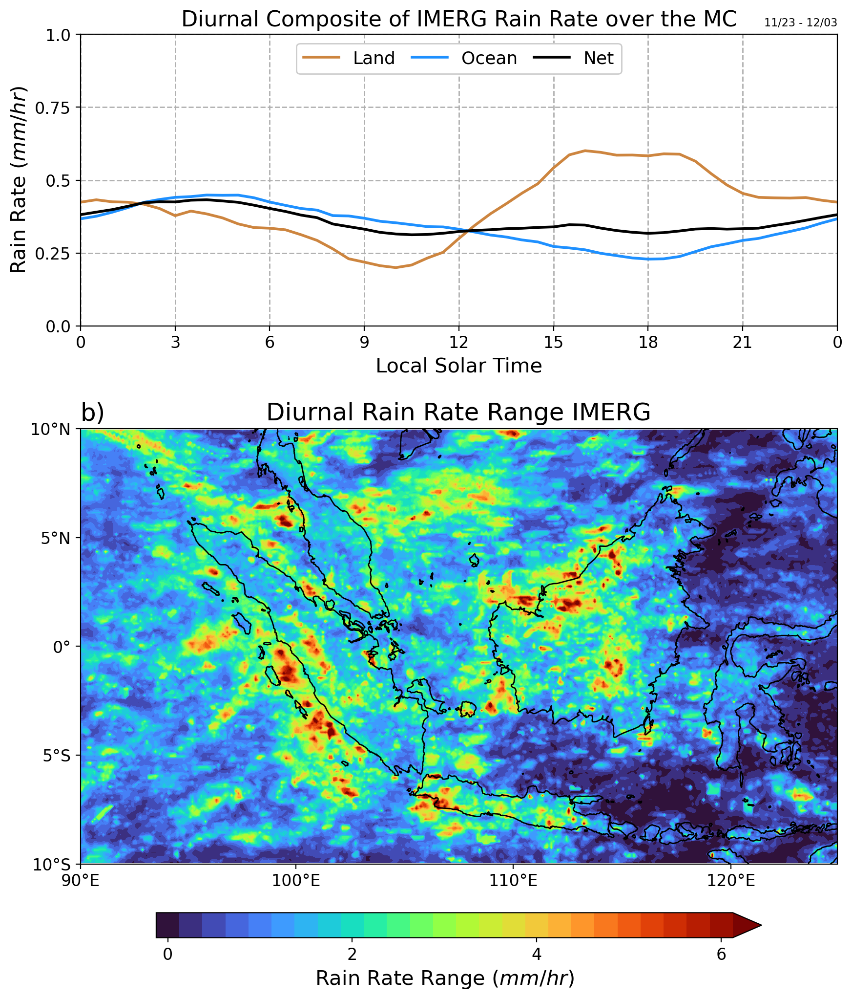

In [12]:
fig = plt.figure(figsize=(10,12))
gs = gridspec.GridSpec(nrows=5, ncols=3, hspace=0, wspace=0, height_ratios=[.35,.075,.62,.01,.03], width_ratios=[.1,.8,.1])

ax1 = fig.add_subplot(gs[0,:])

fs = 18

# RR-land
l1 = RR_land_old.plot.line(
    ax=ax1,
    color='peru',
    linewidth=2,
    linestyle = '-',
	label='Land'
)
l2 = RR_ocean_old.plot.line(
    ax=ax1,
    color='dodgerblue',
    linewidth=2,
    linestyle = '-',
	label='Ocean'
)
l3 = RR_net_old.plot.line(
    ax=ax1,
    color='k',
    linewidth=2,
    linestyle = '-',
	label='Net'
)

ax1.set_xticks(np.arange(0,25,3))
ax1.set_yticks(np.arange(0,3,.25))
title = 'Diurnal Composite of IMERG Rain Rate over the MC'
ax1.set_title(title, fontsize=fs-2)
ax1.set_title('11/23 - 12/03', loc='right', fontsize=fs-10)
# ax1.set_title('12/01 - 12/10', loc='right', fontsize=fs-10)
# ax1.set_title('12/10 - 12/20', loc='right', fontsize=fs-10)
# ax1.set_title('12/15 - 12/25', loc='right', fontsize=fs-10)
# ax1.set_title('12/20 - 12/30', loc='right', fontsize=fs-10)
ax1.set_xlabel('Local Solar Time', fontsize=fs-3)
ax1.set_ylabel('Rain Rate ($mm/hr$)', fontsize=fs-3)
ax1.set_xticklabels(np.concatenate((np.arange(0,24,3),[0])), fontsize=fs-6)
ax1.set_yticklabels(np.arange(0,3,.25), fontsize=fs-6)
ax1.grid(linestyle='--', axis='x', linewidth=1)
ax1.grid(linestyle='--', axis='y', linewidth=1)
ax1.axhline(y=0, color='k', linestyle='-', linewidth=1)
ax1.legend(ncol=3, fontsize=fs-5, loc='upper center', framealpha=1, columnspacing=.92)
ax1.set_xlim([0,24])
ax1.set_ylim([0,1])


ax2 = fig.add_subplot(gs[2,:], projection=ccrs.PlateCarree(central_longitude=0))

levels = [0, 6]
dl = .25
lon_bound_temp = [90,125]
lat_bound_temp = [-10,10]

# No significance shading
cf = range_RR_di_old.plot.contourf(
    ax=ax2,
    add_colorbar=False,
    cmap='turbo',
    levels=np.arange(levels[0]-(dl/2),levels[1]+dl+(dl/2),dl),
    vmin=levels[0], vmax=levels[1],
    x='lon',
    y='lat',
    extend='max',
    xlim=[lon_bound_temp[0], lon_bound_temp[1]],
    ylim=[lat_bound_temp[0], lat_bound_temp[1]],
)


# plot_cross_lines(all_line_coords1,all_line_coords2,all_line_coords3,ax=ax2)
# plot_cross_box(all_line_coords1,all_line_coords2,all_line_coords3,fs,alpha=.75,ax=ax2)

# Set parameters and labels
x_ticks = [90.1,100,110,120]
x_tick_labels = [u'90\N{DEGREE SIGN}E',
                 u'100\N{DEGREE SIGN}E', u'110\N{DEGREE SIGN}E',
                 u'120\N{DEGREE SIGN}E']
y_ticks = [-10,-5,0,5,10]
y_tick_labels = [u'10\N{DEGREE SIGN}S',u'5\N{DEGREE SIGN}S',
		 		u'0\N{DEGREE SIGN}',
				u'5\N{DEGREE SIGN}N',u'10\N{DEGREE SIGN}N']

# Plot the coast lines
ax2.coastlines(linewidth=1, color='k', resolution='10m')  # cartopy function

ax2.set_title('Diurnal Rain Rate Range IMERG', fontsize=fs, loc='center')
ax2.set_title('b)', loc='left', fontsize=fs)
ax2.set_xticks(x_ticks)
ax2.set_xticklabels(x_tick_labels, fontsize=fs-6)
ax2.set_yticks(y_ticks)
ax2.set_yticklabels(y_tick_labels, fontsize=fs-6)
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.set_xlim([90.1,124.9])

ax3 = fig.add_subplot(gs[4,1])
# cbar = plt.colorbar(cf, cax=ax3, orientation='horizontal', extend='both', ticks=np.arange(-10,12,2))
cbar = plt.colorbar(cf, cax=ax3, orientation='horizontal', extend='both', ticks=np.arange(levels[0],levels[1]+1,2))
cbar.set_ticklabels(np.arange(levels[0],levels[1]+1,2), fontsize=fs-6)
cbar.minorticks_off()
cbar.set_label('Rain Rate Range ($mm/hr$)', fontsize=fs-3)

Probability Distributions

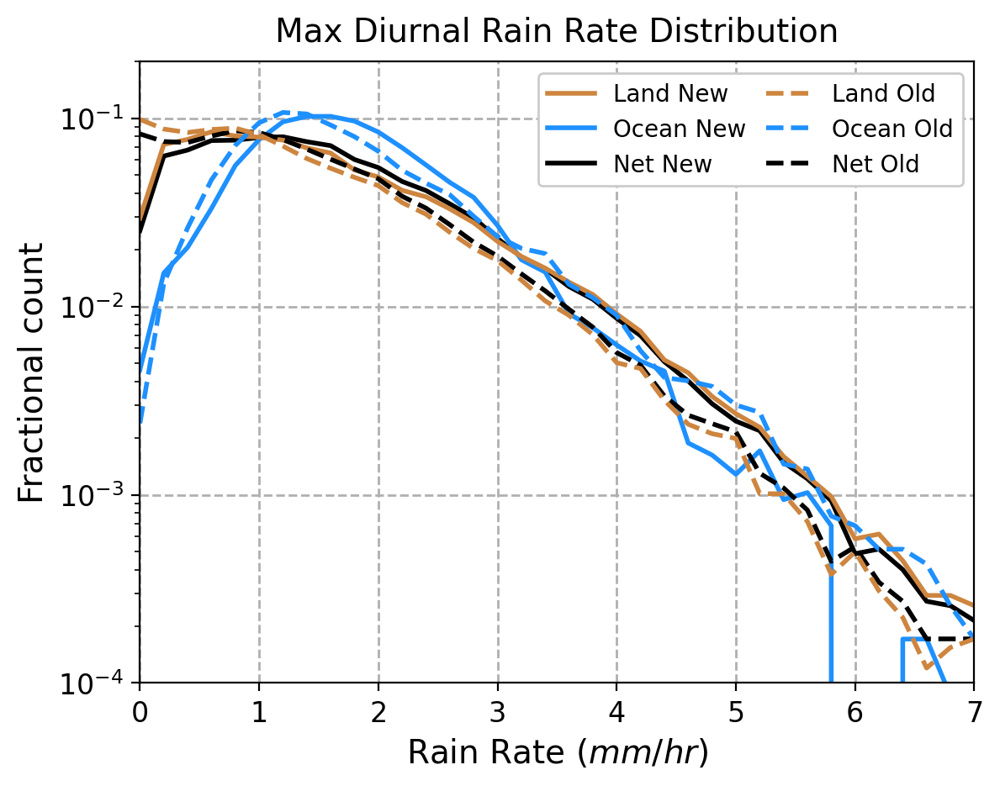

In [103]:
probability_density = True
fs = 18

plt.axvline(x=0, color='k', linestyle='--', linewidth=.75)
plt.grid(linestyle='--', axis='both', linewidth=1)
x_low_lim = 0
x_high_lim = 7
x_dl = .2
bins = np.arange(x_low_lim,x_high_lim+(x_dl*2),x_dl)
x_ticks = np.arange(x_low_lim,x_high_lim+x_dl,1)

y_low_lim = 0
y_high_lim = .5
y_dl = .025
y_ticks = np.arange(y_low_lim,y_high_lim+y_dl,y_dl)

# a = np.histogram(RR_di_new.values.flatten(), bins=bins, density=probability_density)
# b = np.histogram(RR_di_land_new.values.flatten(), bins=bins, density=probability_density)
# c = np.histogram(RR_di_ocean_new.values.flatten(), bins=bins, density=probability_density)

a = np.histogram(RR_di_new.max(dim='hour').values.flatten(), bins=bins, density=probability_density)
b = np.histogram(RR_di_land_new.max(dim='hour').values.flatten(), bins=bins, density=probability_density)
c = np.histogram(RR_di_ocean_new.max(dim='hour').values.flatten(), bins=bins, density=probability_density)

# a1 = plt.plot(a[1][:-1], a[0]*(x_dl), color='k', linewidth=2, label=f'Net n = {np.nansum(~np.isnan(RR_di_new.values.flatten()))}')
# b1 = plt.plot(b[1][:-1], b[0]*(x_dl), color='dodgerblue', linewidth=2, label=f'Ocean n = {np.nansum(~np.isnan(RR_di_ocean_new.values.flatten()))}')
# c1 = plt.plot(c[1][:-1], c[0]*(x_dl), color='peru', linewidth=2, label=f'Land n = {np.nansum(~np.isnan(RR_di_land_new.values.flatten()))}')
a1 = plt.plot(a[1][:-1], a[0]*(x_dl), color='k', linewidth=2, label=f'Net New')
b1 = plt.plot(b[1][:-1], b[0]*(x_dl), color='dodgerblue', linewidth=2, label=f'Ocean New')
c1 = plt.plot(c[1][:-1], c[0]*(x_dl), color='peru', linewidth=2, label=f'Land New')

# a = np.histogram(RR_di_old.values.flatten(), bins=bins, density=probability_density)
# b = np.histogram(RR_di_land_old.values.flatten(), bins=bins, density=probability_density)
# c = np.histogram(RR_di_ocean_old.values.flatten(), bins=bins, density=probability_density)

a = np.histogram(RR_di_old.max(dim='hour').values.flatten(), bins=bins, density=probability_density)
b = np.histogram(RR_di_land_old.max(dim='hour').values.flatten(), bins=bins, density=probability_density)
c = np.histogram(RR_di_ocean_old.max(dim='hour').values.flatten(), bins=bins, density=probability_density)

# a1 = plt.plot(a[1][:-1], a[0]*(x_dl), color='k', linestyle='--', linewidth=2, label=f'Net n = {np.nansum(~np.isnan(RR_di_new.values.flatten()))}')
# b1 = plt.plot(b[1][:-1], b[0]*(x_dl), color='dodgerblue', linestyle='--', linewidth=2, label=f'Ocean n = {np.nansum(~np.isnan(RR_di_ocean_new.values.flatten()))}')
# c1 = plt.plot(c[1][:-1], c[0]*(x_dl), color='peru', linestyle='--', linewidth=2, label=f'Land n = {np.nansum(~np.isnan(RR_di_land_new.values.flatten()))}')
a1 = plt.plot(a[1][:-1], a[0]*(x_dl), color='k', linestyle='--', linewidth=2, label=f'Net Old')
b1 = plt.plot(b[1][:-1], b[0]*(x_dl), color='dodgerblue', linestyle='--', linewidth=2, label=f'Ocean Old')
c1 = plt.plot(c[1][:-1], c[0]*(x_dl), color='peru', linestyle='--', linewidth=2, label=f'Land Old')


plt.title(f'Max Diurnal Rain Rate Distribution', fontsize=fs-4, y=1.01)
# plt.title('12/10 - 12/20', loc='right', fontsize=fs-10)
plt.xlabel('Rain Rate ($mm/hr$)', fontsize=fs-4)
plt.xticks(x_ticks, fontsize=fs-6)
plt.xlim([0,x_high_lim])
plt.yticks(y_ticks, fontsize=fs-6)

## Reordering legend manually
handles, labels = plt.gca().get_legend_handles_labels()
order = [2, 1, 0, 5, 4, 3]  # Indices for "Land", "Ocean", "Net"
plt.legend(
    [handles[idx] for idx in order],
    [labels[idx] for idx in order],
    fontsize=fs - 8,
    loc='upper right',
    framealpha=1,
	ncol=2,
	columnspacing=.85,
)

if probability_density:
	plt.ylabel('Fractional count', fontsize=fs-4)
	# plt.ylim([0.00001,y_high_lim])
	plt.ylim([0.0001,.2])
else: 
	plt.ylabel('# of grids', fontsize=fs-4)
	

plt.yscale('log')

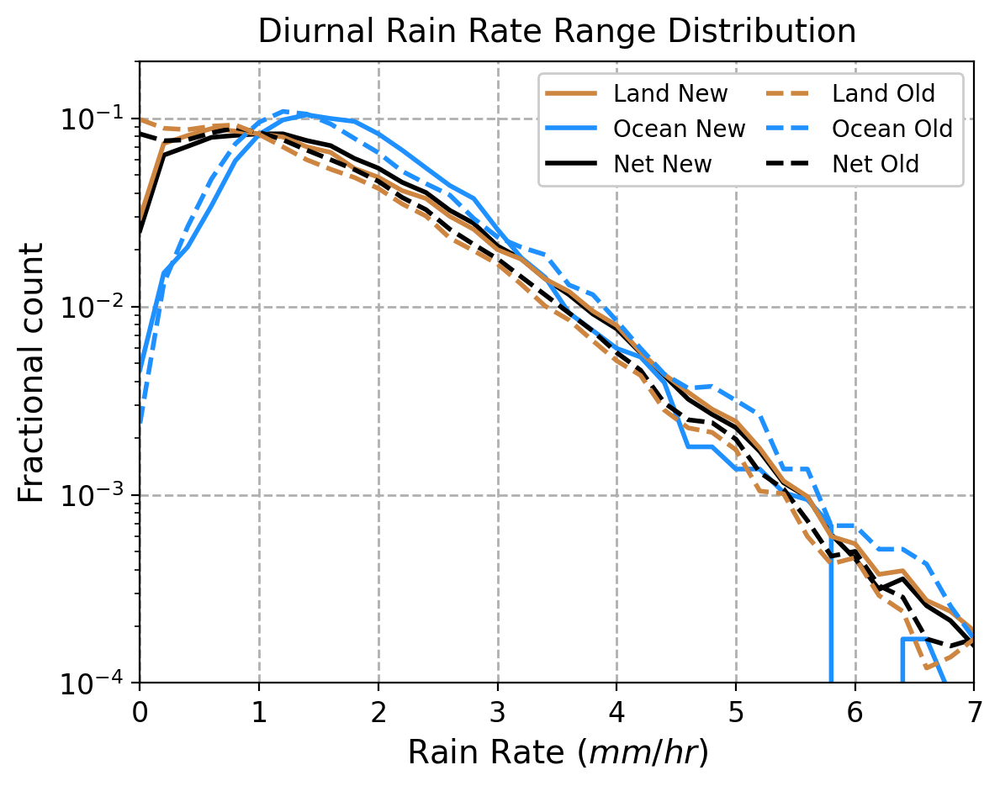

In [102]:
probability_density = True
fs = 18

plt.axvline(x=0, color='k', linestyle='--', linewidth=.75)
plt.grid(linestyle='--', axis='both', linewidth=1)
x_low_lim = 0
x_high_lim = 7
x_dl = .2
bins = np.arange(x_low_lim,x_high_lim+(x_dl*2),x_dl)
x_ticks = np.arange(x_low_lim,x_high_lim+x_dl,1)

y_low_lim = 0
y_high_lim = .5
y_dl = .025
y_ticks = np.arange(y_low_lim,y_high_lim+y_dl,y_dl)

# a = np.histogram(range_RR_di_new.values.flatten(), bins=bins, density=probability_density)
# b = np.histogram(range_RR_di_land_new.values.flatten(), bins=bins, density=probability_density)
# c = np.histogram(range_RR_di_ocean_new.values.flatten(), bins=bins, density=probability_density)

a = np.histogram(range_RR_di_new.values.flatten(), bins=bins, density=probability_density)
b = np.histogram(range_RR_di_land_new.values.flatten(), bins=bins, density=probability_density)
c = np.histogram(range_RR_di_ocean_new.values.flatten(), bins=bins, density=probability_density)

a1 = plt.plot(a[1][:-1], a[0]*(x_dl), color='k', linewidth=2, label=f'Net New')
b1 = plt.plot(b[1][:-1], b[0]*(x_dl), color='dodgerblue', linewidth=2, label=f'Ocean New')
c1 = plt.plot(c[1][:-1], c[0]*(x_dl), color='peru', linewidth=2, label=f'Land New')

# a = np.histogram(range_RR_di_old.values.flatten(), bins=bins, density=probability_density)
# b = np.histogram(range_RR_di_land_old.values.flatten(), bins=bins, density=probability_density)
# c = np.histogram(range_RR_di_ocean_old.values.flatten(), bins=bins, density=probability_density)

a = np.histogram(range_RR_di_old.values.flatten(), bins=bins, density=probability_density)
b = np.histogram(range_RR_di_land_old.values.flatten(), bins=bins, density=probability_density)
c = np.histogram(range_RR_di_ocean_old.values.flatten(), bins=bins, density=probability_density)

a1 = plt.plot(a[1][:-1], a[0]*(x_dl), color='k', linestyle='--', linewidth=2, label=f'Net Old')
b1 = plt.plot(b[1][:-1], b[0]*(x_dl), color='dodgerblue', linestyle='--', linewidth=2, label=f'Ocean Old')
c1 = plt.plot(c[1][:-1], c[0]*(x_dl), color='peru', linestyle='--', linewidth=2, label=f'Land Old')


plt.title(f'Diurnal Rain Rate Range Distribution', fontsize=fs-4, y=1.01)
# plt.title('12/10 - 12/20', loc='right', fontsize=fs-10)
plt.xlabel('Rain Rate ($mm/hr$)', fontsize=fs-4)
plt.xticks(x_ticks, fontsize=fs-6)
plt.xlim([0,x_high_lim])
plt.yticks(y_ticks, fontsize=fs-6)

## Reordering legend manually
handles, labels = plt.gca().get_legend_handles_labels()
order = [2, 1, 0, 5, 4, 3]  # Indices for "Land", "Ocean", "Net"
plt.legend(
    [handles[idx] for idx in order],
    [labels[idx] for idx in order],
    fontsize=fs - 8,
    loc='upper right',
    framealpha=1,
	ncol=2,
	columnspacing=.85,
)

if probability_density:
	plt.ylabel('Fractional count', fontsize=fs-4)
	# plt.ylim([0.00001,y_high_lim])
	plt.ylim([0.0001,.2])
else: 
	plt.ylabel('# of grids', fontsize=fs-4)
	

plt.yscale('log')

Hovmoller

Text(0, 0.5, '')

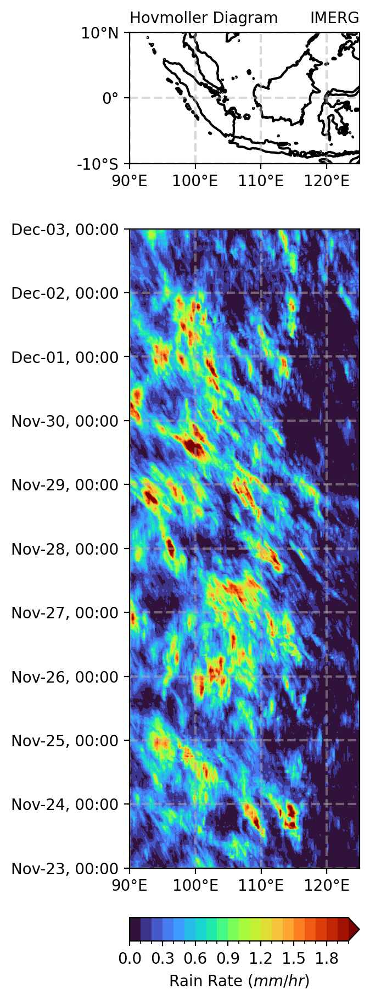

In [91]:
#######################################################################
################## Top plot for Hovmoller diagram #####################
#######################################################################

fig = plt.figure(figsize=(2.7,11))

# Use gridspec to help size elements of plot; small top plot and big bottom plot
gs = gridspec.GridSpec(nrows=5, ncols=1, hspace=0.075, height_ratios=[0.15,0.015,0.55,0.02,0.02])

# Top plot for geographic reference (makes small map)
ax1 = fig.add_subplot(gs[0, 0], projection=ccrs.PlateCarree(central_longitude=0))
ax1.set_extent([lon_bound[0], lon_bound[1], lat_bound[0], lat_bound[1]], ccrs.PlateCarree(central_longitude=0))
# Tick labels
ax1.set_yticks([-10, 0, 10])
ax1.set_yticklabels([u'-10\N{DEGREE SIGN}S', u'0\N{DEGREE SIGN}', u'10\N{DEGREE SIGN}N'])
ax1.set_xticks(np.arange(lon_bound[0],lon_bound[1],10))
x_tick_labels = [u'90\N{DEGREE SIGN}E',
                 u'100\N{DEGREE SIGN}E', u'110\N{DEGREE SIGN}E',
                 u'120\N{DEGREE SIGN}E']
ax1.set_xticklabels(x_tick_labels)
ax1.grid(linestyle='--', linewidth=1.5, alpha=.5)
# Plot the coast lines
ax1.coastlines(linewidth=1.5, color='k', resolution='50m')  # cartopy function

# Set titles
plt.title('Hovmoller Diagram', loc='left', fontsize=10)
plt.title('IMERG', loc='right', fontsize=10)

#######################################################################
################## Bottom plot for Hovmoller diagram ##################
#######################################################################

ax2 = fig.add_subplot(gs[2, 0]) # ax2.invert_yaxis()

## Preparing data to be plotted
# Read in the data:
x1 = da_RR_IMERG_old.mean('lat')

# Plot the rain rates
cf2 = x1.plot.contourf(
	ax=ax2,
	add_colorbar=False,
	xticks=np.arange(lon_bound[0],lon_bound[1],10),
	cmap='turbo',
	levels=np.arange(0,2.1,.1),
	extend='max'
)

# Create grids
ax2.grid(linestyle='--', linewidth=1.5, alpha=.5)

# Plot the colorbars
	# Rain rate colorbar
ax4 = fig.add_subplot(gs[4, 0])
cbar2 = plt.colorbar(cf2, cax=ax4, orientation='horizontal', pad=0.5, aspect=100, extend='max')
cbar2.set_label('Rain Rate ($mm/hr$)')

# Set titles/labels
# ax2.set_title('Rain rate', loc='left', fontsize=10)
ax2.set_title('', loc='right', fontsize=10)
ax2.set_xticklabels(x_tick_labels)
# ax2.set_yticks(y.time[0::4])
t = x1.time[::48].dt.strftime("%b-%d, %H:%M")
ax2.set_yticks(x1.time[::48])
ax2.set_yticklabels(t.values)
ax2.set_xlabel('')
ax2.set_ylabel('')


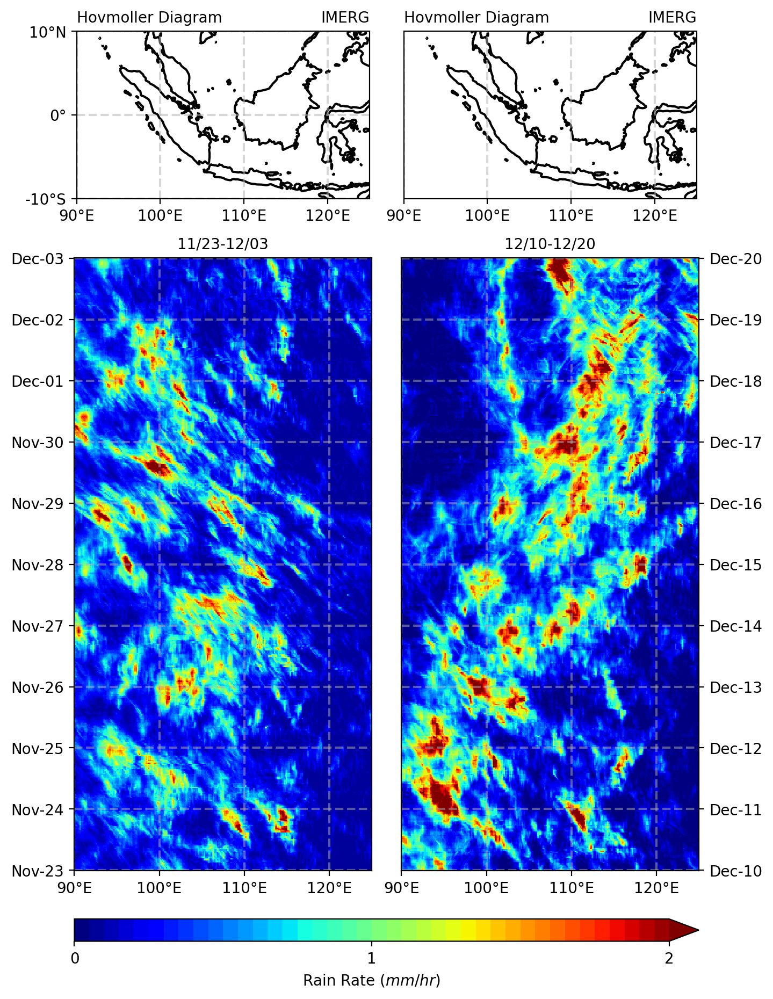

In [39]:
clevel = [0,2]
cdl = .05

#######################################################################
################## Top plot for Hovmoller diagram #####################
#######################################################################

fig = plt.figure(figsize=(7.5,11))

# Use gridspec to help size elements of plot; small top plot and big bottom plot
gs = gridspec.GridSpec(nrows=5, ncols=2, hspace=0.075, wspace=0.1, height_ratios=[0.15,0.03,0.55,0.02,0.02], width_ratios=[.5,.5])

## Top plot for geographic reference (makes small map)
ax1 = fig.add_subplot(gs[0, 0], projection=ccrs.PlateCarree(central_longitude=0))
ax1.set_extent([lon_bound[0], lon_bound[1], lat_bound[0], lat_bound[1]], ccrs.PlateCarree(central_longitude=0))
# Tick labels
ax1.set_yticks([-10, 0, 10])
ax1.set_yticklabels([u'-10\N{DEGREE SIGN}S', u'0\N{DEGREE SIGN}', u'10\N{DEGREE SIGN}N'])
ax1.set_xticks(np.arange(lon_bound[0],lon_bound[1],10))
x_tick_labels = [u'90\N{DEGREE SIGN}E',
                 u'100\N{DEGREE SIGN}E', u'110\N{DEGREE SIGN}E',
                 u'120\N{DEGREE SIGN}E']
ax1.set_xticklabels(x_tick_labels)
ax1.grid(linestyle='--', linewidth=1.5, alpha=.5)
# Plot the coast lines
ax1.coastlines(linewidth=1.5, color='k', resolution='50m')  # cartopy function

# Set titles
ax1.set_title('Hovmoller Diagram', loc='left', fontsize=10)
ax1.set_title('IMERG', loc='right', fontsize=10)

## Top plot for geographic reference (makes small map)
ax2 = fig.add_subplot(gs[0, 1], projection=ccrs.PlateCarree(central_longitude=0))
ax2.set_extent([lon_bound[0], lon_bound[1], lat_bound[0], lat_bound[1]], ccrs.PlateCarree(central_longitude=0))
# Tick labels
# ax2.set_yticks([-10, 0, 10])
# ax2.set_yticklabels([u'-10\N{DEGREE SIGN}S', u'0\N{DEGREE SIGN}', u'10\N{DEGREE SIGN}N'])
ax2.set_xticks(np.arange(lon_bound[0],lon_bound[1],10))
x_tick_labels = [u'90\N{DEGREE SIGN}E',
                 u'100\N{DEGREE SIGN}E', u'110\N{DEGREE SIGN}E',
                 u'120\N{DEGREE SIGN}E']
ax2.set_xticklabels(x_tick_labels)
ax2.grid(linestyle='--', linewidth=1.5, alpha=.5)
# Plot the coast lines
ax2.coastlines(linewidth=1.5, color='k', resolution='50m')  # cartopy function

# Set titles
ax2.set_title('Hovmoller Diagram', loc='left', fontsize=10)
ax2.set_title('IMERG', loc='right', fontsize=10)

#######################################################################
################## Bottom plot for Hovmoller diagram ##################
#######################################################################

ax3 = fig.add_subplot(gs[2, 0])
## Preparing data to be plotted
# Plot the rain rates
cf1 = da_RR_IMERG_old.mean('lat').plot(
	ax=ax3,
	add_colorbar=False,
	xticks=np.arange(lon_bound[0],lon_bound[1],10),
	cmap='jet',
	levels=np.arange(clevel[0], clevel[1]+cdl, cdl),
	extend='both'
)
# Create grids
ax3.grid(linestyle='--', linewidth=1.5, alpha=.5)
ax3.set_title('11/23-12/03', loc='center', fontsize=10)
ax3.set_xticklabels(x_tick_labels)
t = da_RR_IMERG_old.time[::48].dt.strftime("%b-%d")
ax3.set_yticks(da_RR_IMERG_old.time[::48])
ax3.set_yticklabels(t.values)
ax3.set_xlabel('')
ax3.set_ylabel('')


ax4 = fig.add_subplot(gs[2, 1])
## Preparing data to be plotted
# Plot the rain rates
cf2 = da_RR_IMERG_new.mean('lat').plot(
    ax=ax4,
    add_colorbar=False,
    xticks=np.arange(lon_bound[0], lon_bound[1], 10),
    cmap='jet',
    levels=np.arange(clevel[0], clevel[1]+cdl, cdl),
    extend='max'
)
# Create grids
ax4.grid(linestyle='--', linewidth=1.5, alpha=0.5)
ax4.set_title('12/10-12/20', loc='center', fontsize=10)
ax4.set_xticklabels(x_tick_labels)
# Set y-ticks
t = da_RR_IMERG_new.time[::48].dt.strftime("%b-%d")
ax4.set_yticks(da_RR_IMERG_new.time[::48])
ax4.set_yticklabels(t.values)
# Move y-axis ticks and labels to the right
ax4.yaxis.tick_right()
ax4.yaxis.set_label_position('right')
ax4.set_xlabel('')
ax4.set_ylabel('')

# Plot the colorbars
	# Rain rate colorbar
ax5 = fig.add_subplot(gs[4, :])
cbar2 = plt.colorbar(cf2, cax=ax5, orientation='horizontal', pad=0.5, aspect=100, extend='max')
cbar_ticks = np.arange(clevel[0],clevel[1]+cdl)
cbar2.set_ticks(cbar_ticks)
cbar2.minorticks_off()
# cbar2.set_ticklabels(cbar_ticks, fontsize=fs-6)
cbar2.set_label('Rain Rate ($mm/hr$)')


Time Average Spatial

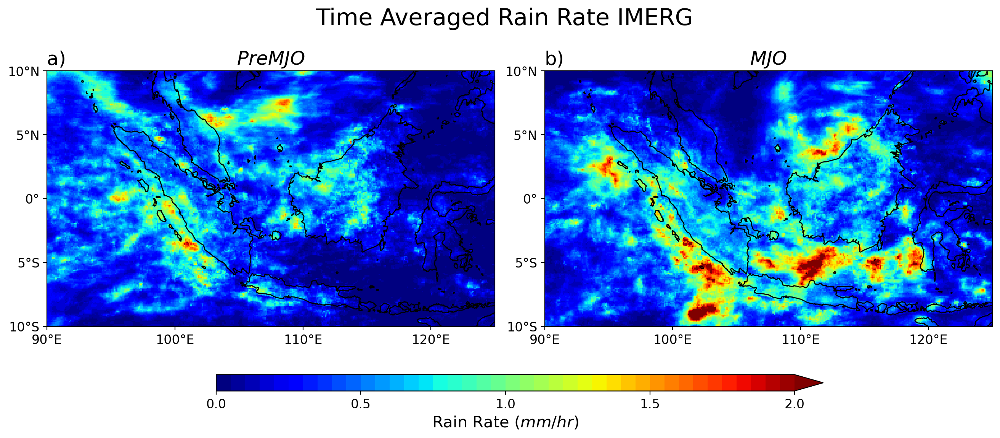

In [24]:
fig = plt.figure(figsize=(16,6))
gs = gridspec.GridSpec(nrows=2, ncols=4, hspace=.1, wspace=0.25, height_ratios=[.97,.05], width_ratios=[.15,.35,.35,.15])

fs=18

fig.suptitle('Time Averaged Rain Rate IMERG', fontsize=fs+4, y=.95)

levels = [0, 2]
dl = .05
lon_bound_temp = [90,125]
lat_bound_temp = [-10,10]

# Set parameters and labels
x_ticks = [90,100,110,120]
x_tick_labels = [u'90\N{DEGREE SIGN}E',
                 u'100\N{DEGREE SIGN}E', u'110\N{DEGREE SIGN}E',
                 u'120\N{DEGREE SIGN}E']
y_ticks = [-10,-5,0,5,10]
y_tick_labels = [u'10\N{DEGREE SIGN}S',u'5\N{DEGREE SIGN}S',
		 		u'0\N{DEGREE SIGN}',
				u'5\N{DEGREE SIGN}N',u'10\N{DEGREE SIGN}N']

def plot_timeavg_RR(ax, da):
    cf = da.mean('time').plot(
        ax=ax,
        add_colorbar=False,
        cmap='jet',
        levels=np.arange(levels[0],levels[1]+dl,dl),
        vmin=levels[0], vmax=levels[1],
        x='lon',
        y='lat',
        xlim=[lon_bound_temp[0], lon_bound_temp[1]],
        ylim=[lat_bound_temp[0], lat_bound_temp[1]],
    )

    ax.coastlines(linewidth=1, color='k', resolution='10m')  # cartopy function
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(x_tick_labels, fontsize=fs-6)
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(y_tick_labels, fontsize=fs-6)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_xlim([lon_bound_temp[0],lon_bound_temp[1]])
    ax.set_ylim([lat_bound_temp[0],lat_bound_temp[1]])

    return cf

ax1 = fig.add_subplot(gs[0,0:2], projection=ccrs.PlateCarree(central_longitude=0))
cf1 = plot_timeavg_RR(ax1, da_RR_IMERG_old)
ax1.set_title('$PreMJO$', fontsize=fs, loc='center')
ax1.set_title('a)', loc='left', fontsize=fs)

ax2 = fig.add_subplot(gs[0,2:4], projection=ccrs.PlateCarree(central_longitude=0))
cf2 = plot_timeavg_RR(ax2, da_RR_IMERG_new)
ax2.set_title('$MJO$', fontsize=fs, loc='center')
ax2.set_title('b)', loc='left', fontsize=fs)

ax3 = fig.add_subplot(gs[1,1:3])
cbar = plt.colorbar(cf1, cax=ax3, orientation='horizontal', extend='max', ticks=np.arange(levels[0],levels[1]+1,.5))
cbar.set_ticklabels(np.arange(levels[0],levels[1]+1,.5), fontsize=fs-6)
cbar.minorticks_off()
cbar.set_label('Rain Rate ($mm/hr$)', fontsize=fs-3)

Diurnal Phase

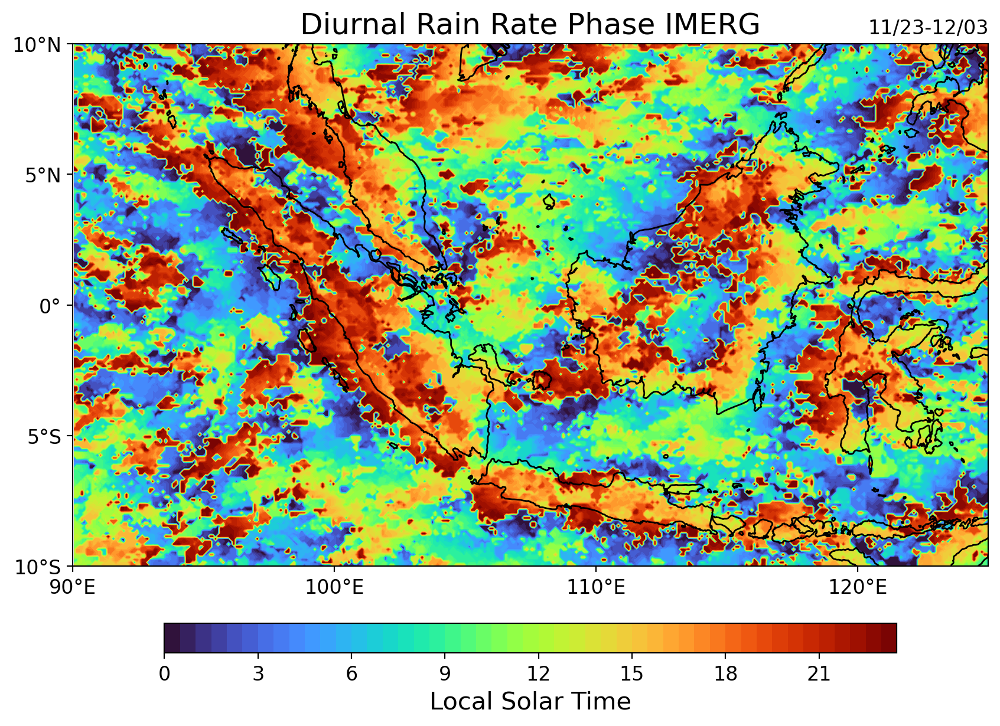

In [94]:
fig = plt.figure(figsize=(10,7))
gs = gridspec.GridSpec(nrows=2, ncols=3, hspace=.1, wspace=0, height_ratios=[.97,.05], width_ratios=[.1,.8,.1])

ax1 = fig.add_subplot(gs[0,:], projection=ccrs.PlateCarree(central_longitude=0))

levels = [0, 23.5]
dl = .5
lon_bound_temp = [90,125]
lat_bound_temp = [-10,10]

da_RR_phase_IMERG_old = RR_di_old.idxmax('hour',keep_attrs=True)
# No significance shading
cf = da_RR_phase_IMERG_old.plot.contourf(
    ax=ax1,
    add_colorbar=False,
    cmap='turbo',
    levels=np.arange(levels[0],levels[1]+dl,dl),
    vmin=levels[0], vmax=levels[1],
    x='lon',
    y='lat',
    xlim=[lon_bound_temp[0], lon_bound_temp[1]],
    ylim=[lat_bound_temp[0], lat_bound_temp[1]],
)


# plot_cross_lines(all_line_coords1,all_line_coords2,all_line_coords3,ax=ax1)
# plot_cross_box(all_line_coords1,all_line_coords2,all_line_coords3,fs,alpha=.75,ax=ax1)

# Set parameters and labels
x_ticks = [90,100,110,120]
x_tick_labels = [u'90\N{DEGREE SIGN}E',
                 u'100\N{DEGREE SIGN}E', u'110\N{DEGREE SIGN}E',
                 u'120\N{DEGREE SIGN}E']
y_ticks = [-10,-5,0,5,10]
y_tick_labels = [u'10\N{DEGREE SIGN}S',u'5\N{DEGREE SIGN}S',
		 		u'0\N{DEGREE SIGN}',
				u'5\N{DEGREE SIGN}N',u'10\N{DEGREE SIGN}N']

# Plot the coast lines
ax1.coastlines(linewidth=1, color='k', resolution='10m')  # cartopy function

ax1.set_title('Diurnal Rain Rate Phase IMERG', fontsize=fs, loc='center')
ax1.set_title('11/23-12/03', loc='right', fontsize=fs-6)
ax1.set_xticks(x_ticks)
ax1.set_xticklabels(x_tick_labels, fontsize=fs-6)
ax1.set_yticks(y_ticks)
ax1.set_yticklabels(y_tick_labels, fontsize=fs-6)
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.set_xlim([90,125])

ax2 = fig.add_subplot(gs[1,1])
cbar = plt.colorbar(cf, cax=ax2, orientation='horizontal', extend='both', ticks=np.arange(0,24,3))
cbar.set_ticklabels(np.arange(0,24,3), fontsize=fs-6)
cbar.minorticks_off()
cbar.set_label('Local Solar Time', fontsize=fs-3)

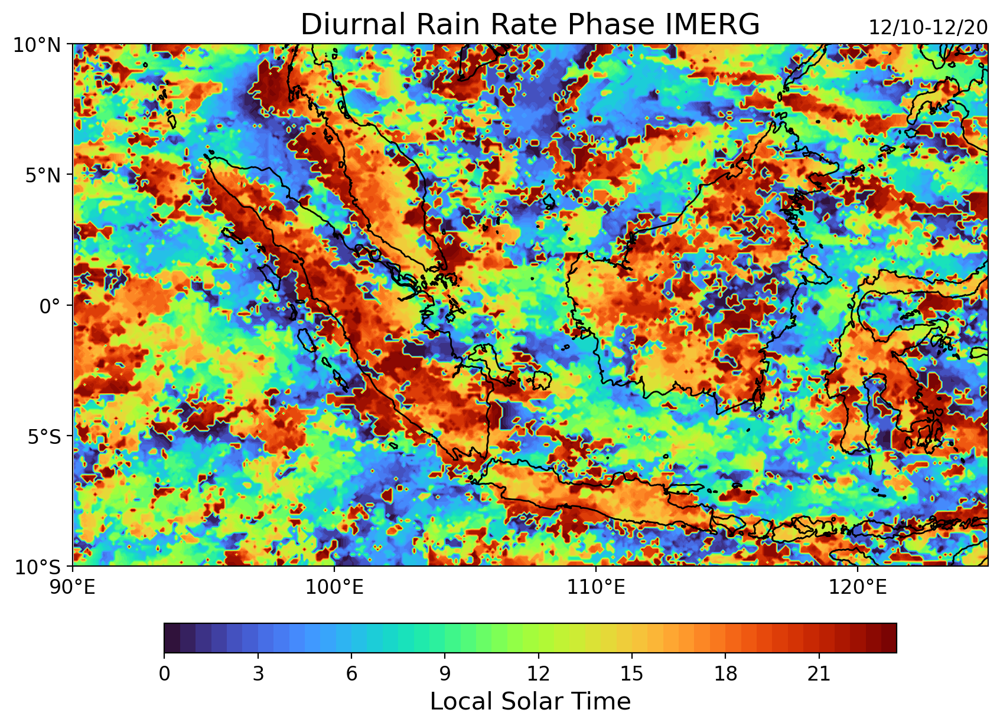

In [95]:
fig = plt.figure(figsize=(10,7))
gs = gridspec.GridSpec(nrows=2, ncols=3, hspace=.1, wspace=0, height_ratios=[.97,.05], width_ratios=[.1,.8,.1])

ax1 = fig.add_subplot(gs[0,:], projection=ccrs.PlateCarree(central_longitude=0))

levels = [0, 23.5]
dl = .5
lon_bound_temp = [90,125]
lat_bound_temp = [-10,10]

da_RR_phase_IMERG_new = RR_di_new.idxmax('hour',keep_attrs=True)
# No significance shading
cf = da_RR_phase_IMERG_new.plot.contourf(
    ax=ax1,
    add_colorbar=False,
    cmap='turbo',
    levels=np.arange(levels[0],levels[1]+dl,dl),
    vmin=levels[0], vmax=levels[1],
    x='lon',
    y='lat',
    xlim=[lon_bound_temp[0], lon_bound_temp[1]],
    ylim=[lat_bound_temp[0], lat_bound_temp[1]],
)


# plot_cross_lines(all_line_coords1,all_line_coords2,all_line_coords3,ax=ax1)
# plot_cross_box(all_line_coords1,all_line_coords2,all_line_coords3,fs,alpha=.75,ax=ax1)

# Set parameters and labels
x_ticks = [90,100,110,120]
x_tick_labels = [u'90\N{DEGREE SIGN}E',
                 u'100\N{DEGREE SIGN}E', u'110\N{DEGREE SIGN}E',
                 u'120\N{DEGREE SIGN}E']
y_ticks = [-10,-5,0,5,10]
y_tick_labels = [u'10\N{DEGREE SIGN}S',u'5\N{DEGREE SIGN}S',
		 		u'0\N{DEGREE SIGN}',
				u'5\N{DEGREE SIGN}N',u'10\N{DEGREE SIGN}N']

# Plot the coast lines
ax1.coastlines(linewidth=1, color='k', resolution='10m')  # cartopy function

ax1.set_title('Diurnal Rain Rate Phase IMERG', fontsize=fs, loc='center')
ax1.set_title('12/10-12/20', loc='right', fontsize=fs-6)
ax1.set_xticks(x_ticks)
ax1.set_xticklabels(x_tick_labels, fontsize=fs-6)
ax1.set_yticks(y_ticks)
ax1.set_yticklabels(y_tick_labels, fontsize=fs-6)
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.set_xlim([90,125])

ax2 = fig.add_subplot(gs[1,1])
cbar = plt.colorbar(cf, cax=ax2, orientation='horizontal', extend='both', ticks=np.arange(0,24,3))
cbar.set_ticklabels(np.arange(0,24,3), fontsize=fs-6)
cbar.minorticks_off()
cbar.set_label('Local Solar Time', fontsize=fs-3)

#### Cross Sectional Analysis

In [126]:
da_cross_temp1.shape

(481, 45, 60)

In [131]:
# Collect the cross sectional data from the now rotated coordinate system


# Western Central Sumatra
	# Old coords
# start_coord		= [-1.8,103.8]
# end_coord 		= [-5.8,99.8]
start_coord		= [-2.2,103.2]
end_coord 		= [-6.7,98.7]
width			= 1.5
dx 				= 0.025
# Same analysis but with rain rate
# da_cross_temp1, all_line_coords1 = cross_section_multi(da_RR_IMERG_old, start_coord, end_coord, width, dx)
# Find where the coastline is, then subtract
distance1 = np.linspace(0,dist(start_coord[0], start_coord[1], end_coord[0], end_coord[1]),da_cross_temp1.shape[1])
distance1 = distance1 - distance1[13]


    # North West Sumatra
start_coord		= [5.2,96.4]
end_coord 		= [1.2,92.4]
width			= 1.5
dx 				= 0.025
# da_cross_temp2, all_line_coords2 = cross_section_multi(da_RR_IMERG_old, start_coord, end_coord, width, dx)
# Find where the coastline is, then subtract
distance2 = np.linspace(0,dist(start_coord[0], start_coord[1], end_coord[0], end_coord[1]),da_cross_temp2.shape[1])
distance2 = distance2 - distance2[7]


    # North West Borneo
start_coord		= [1.2,112.8]
end_coord 		= [5.9,108.1]
width			= 1.5
dx 				= 0.025
# da_cross_temp3, all_line_coords3 = cross_section_multi(da_RR_IMERG_old, start_coord, end_coord, width, dx)
# Find where the coastline is, then subtract
distance3 = np.linspace(0,dist(start_coord[0], start_coord[1], end_coord[0], end_coord[1]),da_cross_temp3.shape[1])
distance3 = distance3 - distance3[14]


da_RR_cross1 = xr.DataArray(
	data=da_cross_temp1,
	dims=('Time','Distance','Spread'),
	coords={'Time':da_RR_IMERG_old['time'].values,
		 'Distance':distance1,
		 'Spread':np.arange(width/2,-width/2,-dx),
		 'Lat': (('Distance','Spread'), all_line_coords1[0,:,:]),
		 'Lon': (('Distance','Spread'), all_line_coords1[1,:,:])}
	)

da_RR_cross2 = xr.DataArray(
	data=da_cross_temp2,
	dims=('Time','Distance','Spread'),
	coords={'Time':da_RR_IMERG_old['time'].values,
		 'Distance':distance2,
		 'Spread':np.arange(width/2,-width/2,-dx),
		 'Lat': (('Distance','Spread'), all_line_coords2[0,:,:]),
		 'Lon': (('Distance','Spread'), all_line_coords2[1,:,:])}
	)

da_RR_cross3 = xr.DataArray(
	data=da_cross_temp3,
	dims=('Time','Distance','Spread'),
	coords={'Time':da_RR_IMERG_old['time'].values,
		 'Distance':distance3,
		 'Spread':np.arange(width/2,-width/2,-dx),
		 'Lat': (('Distance','Spread'), all_line_coords3[0,:,:]),
		 'Lon': (('Distance','Spread'), all_line_coords3[1,:,:])}
	)

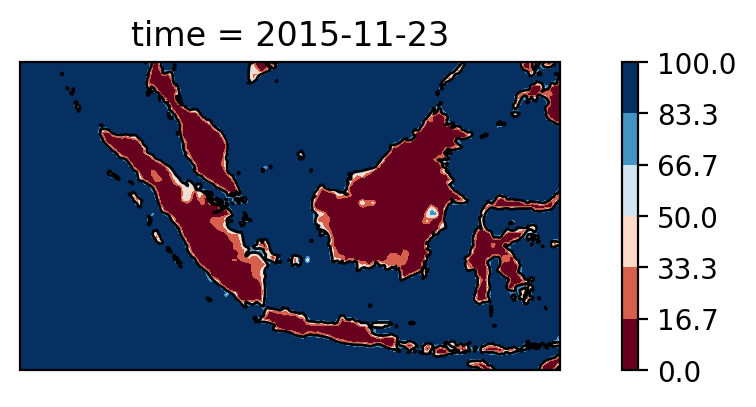

In [43]:
# Testing IMERG MASK
fig = plt.figure(figsize=(8,2))
gs = gridspec.GridSpec(nrows=1, ncols=1)
ax1 = fig.add_subplot(gs[0,0], projection=ccrs.PlateCarree(central_longitude=0))
# cf1 = da_Mask_IMERG[0,...].where(da_Mask_IMERG[0,...]<50).plot.contourf(
# 	cmap='RdBu',		# _r reverses the colorbar order!
#     vmin=0,vmax=100
# )
cf1 = da_Mask_IMERG_old[0,...].plot.contourf(
	cmap='RdBu',		# _r reverses the colorbar order!
    vmin=0,vmax=100
)
ax1.coastlines(linewidth=1, color='k', resolution='50m')  # cartopy function


[Text(0, -6, '6°S'), Text(0, -4, '4°S'), Text(0, -2, '2°S')]

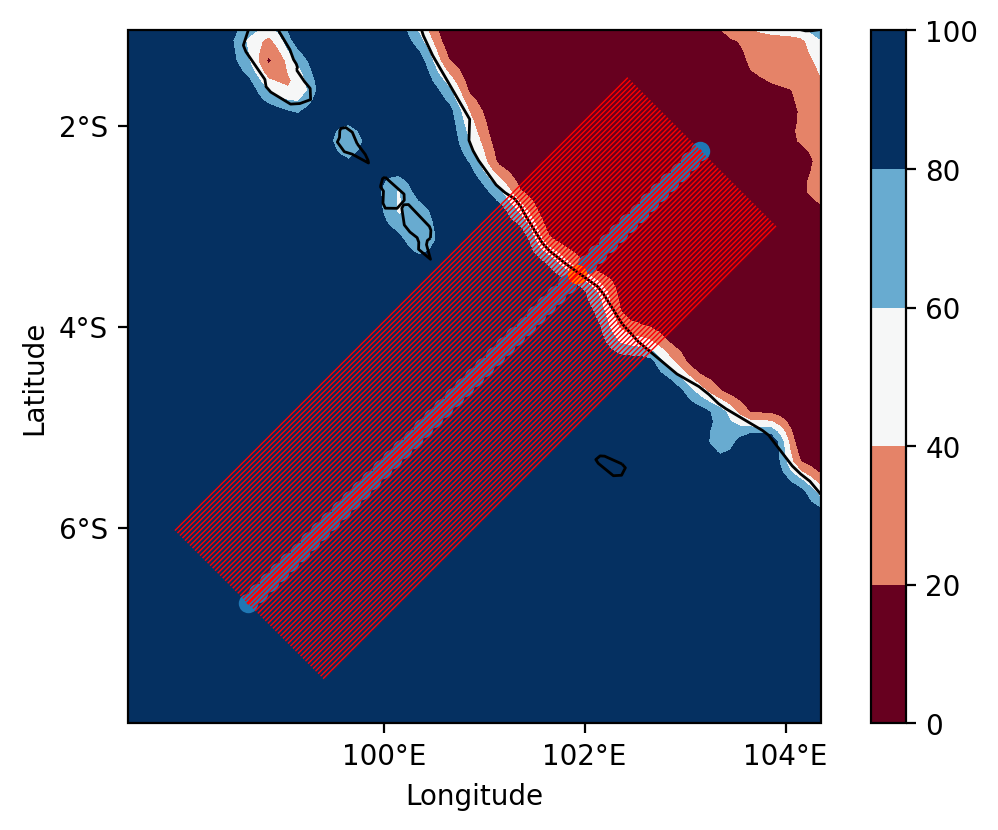

In [110]:
fig = plt.figure(figsize=(6.5,4.5))
gs = gridspec.GridSpec(nrows=1, ncols=1, hspace=0.075)

# d02_coords = dict(
#     south_north=('south_north',ds_d02.XLAT[0,:,0].values),
#     west_east=('west_east',ds_d02.XLONG[0,0,:].values)
#     )
# # # Terrain Height    [m]
# da_d02_TOPO = ds_d02['HGT'].sel(Time=slice(1)).compute().squeeze()
# x = da_d02_TOPO.assign_coords(d02_coords)
width=0.75
lat = [all_line_coords1[0,...].max()+0.5,all_line_coords1[0,...].min()-0.5]
lon = [all_line_coords1[1,...].min()-0.5,all_line_coords1[1,...].max()+0.5]
# lat = [-2,-6]
# lon = [100,104]
# lat = np.add([-2,-6],0.2)
# lon = np.subtract([100,104],0.2)
# lat = np.add([0,-8],0.2)
# lon = np.subtract([98,106],0.2)
# Yokoi et al. 2017-2019 domain:
x = da_Mask_IMERG_old[0,...]
x = x.sel(
	lat=slice(lat[1],lat[0]),
	lon=slice(lon[0],lon[1]))
# x = x.sel(
# 	south_north=slice(lat[1]-(width*1.5),lat[0]+(width*1.5)),
# 	west_east=slice(lon[0]-(width*1.5),lon[1]+(width*1.5)))
x_ticks = np.array([100,102,104])
x_tick_labels = [u'100\N{DEGREE SIGN}E',
                 u'102\N{DEGREE SIGN}E', u'104\N{DEGREE SIGN}E']
y_ticks = np.array([-6,-4,-2])
y_tick_labels = [u'6\N{DEGREE SIGN}S',
                 u'4\N{DEGREE SIGN}S', u'2\N{DEGREE SIGN}S']


# # Summatra domain:
# x = x.sel(
# 	south_north=slice(-7.5,7.5),
# 	west_east=slice(95,105))
# x_ticks = np.array([95,100,105])
# x_tick_labels = [u'95\N{DEGREE SIGN}E',
#                  u'100\N{DEGREE SIGN}E', u'105\N{DEGREE SIGN}E']
# y_ticks = np.array([-7.5,0,7.5])
# y_tick_labels = [u'7.5\N{DEGREE SIGN}S',
#                  u'0\N{DEGREE SIGN}N', u'7.5\N{DEGREE SIGN}N']
# lat = [5.5,-6.5]
# lon = [95.05,104.95]


ax1 = fig.add_subplot(gs[0,0],projection=ccrs.PlateCarree(central_longitude=0))
ax1.coastlines(linewidth=1, color='k', resolution='50m')  # cartopy function
cf1 = x.plot.contourf(
	cmap='RdBu',
	# cmap='gray',
	# levels=np.arange()
	# levels=np.arange(0,4250,250),
	# levels = np.append(0,np.logspace(0,3.65,50))
)
dx = 0.025
# plt.plot(lon,lat,'y')
# plt.plot(lon,lat[::-1],'r',linewidth=1)
for i in range(int(all_line_coords1.shape[2])):
	# plt.plot(np.subtract(lon,i*dx),np.add(lat[::-1],i*dx),'r',linewidth=0.5)
	# plt.plot(np.add(lon,i*dx),np.subtract(lat[::-1],i*dx),'r',linewidth=0.5)
	plt.plot(all_line_coords1[1,:,i],all_line_coords1[0,:,i],'r',linewidth=0.5)
	# plt.plot(np.add(lon,i*dx),np.subtract(lat[::-1],i*dx),'r',linewidth=0.5)
plt.plot(all_line_coords1[1,:,int(all_line_coords1.shape[2]/2)],all_line_coords1[0,:,int(all_line_coords1.shape[2]/2)],'r',linewidth=1)
plt.scatter(all_line_coords1[1,:,int(all_line_coords1.shape[2]/2)],all_line_coords1[0,:,int(all_line_coords1.shape[2]/2)])
# Plot where you think the coastline will be
plt.scatter(all_line_coords1[1,12,int(all_line_coords1.shape[2]/2)],all_line_coords1[0,12,int(all_line_coords1.shape[2]/2)])


ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')
ax1.set_title('')
ax1.set_xticks(x_ticks)
ax1.set_xticklabels(x_tick_labels)
ax1.set_yticks(y_ticks)
ax1.set_yticklabels(y_tick_labels)


Text(0.5, 1.0, '')

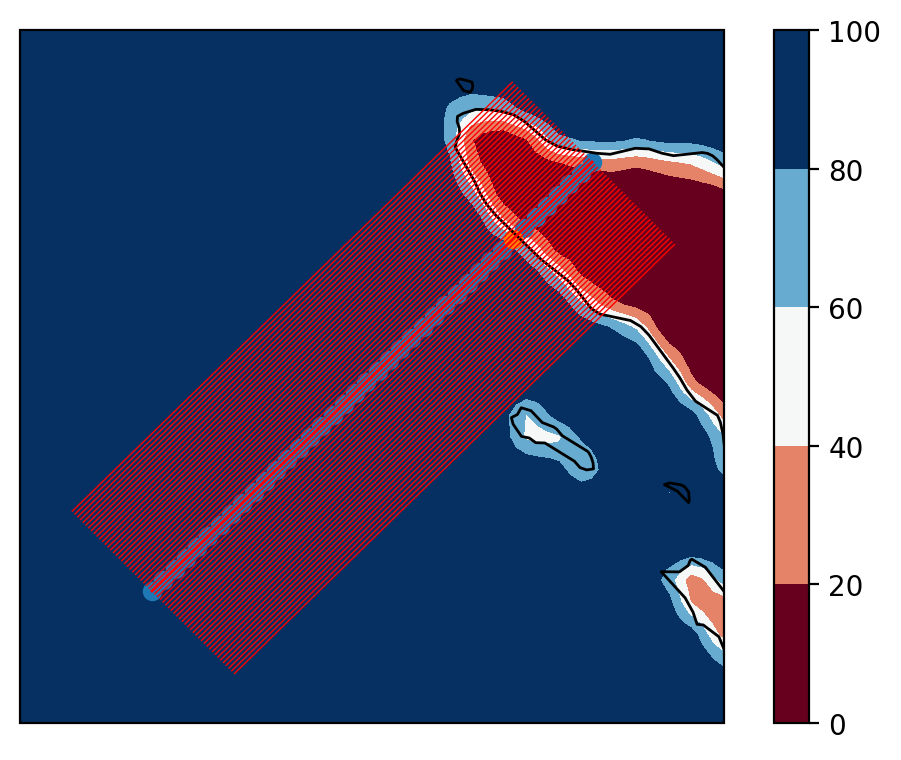

In [111]:
fig = plt.figure(figsize=(6.5,4.5))
gs = gridspec.GridSpec(nrows=1, ncols=1, hspace=0.075)

# d02_coords = dict(
#     south_north=('south_north',ds_d02.XLAT[0,:,0].values),
#     west_east=('west_east',ds_d02.XLONG[0,0,:].values)
#     )
# # # Terrain Height    [m]
# da_d02_TOPO = ds_d02['HGT'].sel(Time=slice(1)).compute().squeeze()
# x = da_d02_TOPO.assign_coords(d02_coords)
width=0.75
lat = [all_line_coords2[0,...].max()+0.5,all_line_coords2[0,...].min()-0.5]
lon = [all_line_coords2[1,...].min()-0.5,all_line_coords2[1,...].max()+0.5]
# lat = [-2,-6]
# lon = [100,104]
# lat = np.add([-2,-6],0.2)
# lon = np.subtract([100,104],0.2)
# lat = np.add([0,-8],0.2)
# lon = np.subtract([98,106],0.2)
# Yokoi et al. 2017-2019 domain:
x = da_Mask_IMERG_old[0,...]
x = x.sel(
	lat=slice(lat[1],lat[0]),
	lon=slice(lon[0],lon[1]))
# x = x.sel(
# 	south_north=slice(lat[1]-(width*1.5),lat[0]+(width*1.5)),
# 	west_east=slice(lon[0]-(width*1.5),lon[1]+(width*1.5)))
x_ticks = np.array([100,102,104])
x_tick_labels = [u'100\N{DEGREE SIGN}E',
                 u'102\N{DEGREE SIGN}E', u'104\N{DEGREE SIGN}E']
y_ticks = np.array([-6,-4,-2])
y_tick_labels = [u'6\N{DEGREE SIGN}S',
                 u'4\N{DEGREE SIGN}S', u'2\N{DEGREE SIGN}S']


# # Summatra domain:
# x = x.sel(
# 	south_north=slice(-7.5,7.5),
# 	west_east=slice(95,105))
# x_ticks = np.array([95,100,105])
# x_tick_labels = [u'95\N{DEGREE SIGN}E',
#                  u'100\N{DEGREE SIGN}E', u'105\N{DEGREE SIGN}E']
# y_ticks = np.array([-7.5,0,7.5])
# y_tick_labels = [u'7.5\N{DEGREE SIGN}S',
#                  u'0\N{DEGREE SIGN}N', u'7.5\N{DEGREE SIGN}N']
# lat = [5.5,-6.5]
# lon = [95.05,104.95]


ax1 = fig.add_subplot(gs[0,0],projection=ccrs.PlateCarree(central_longitude=0))
ax1.coastlines(linewidth=1, color='k', resolution='50m')  # cartopy function
cf1 = x.plot.contourf(
	cmap='RdBu',
	# cmap='gray',
	# levels=np.arange()
	# levels=np.arange(0,4250,250),
	# levels = np.append(0,np.logspace(0,3.65,50))
)
dx = 0.025
# plt.plot(lon,lat,'y')
# plt.plot(lon,lat[::-1],'r',linewidth=1)
for i in range(int(all_line_coords2.shape[2])):
	# plt.plot(np.subtract(lon,i*dx),np.add(lat[::-1],i*dx),'r',linewidth=0.5)
	# plt.plot(np.add(lon,i*dx),np.subtract(lat[::-1],i*dx),'r',linewidth=0.5)
	plt.plot(all_line_coords2[1,:,i],all_line_coords2[0,:,i],'r',linewidth=0.5)
	# plt.plot(np.add(lon,i*dx),np.subtract(lat[::-1],i*dx),'r',linewidth=0.5)
plt.plot(all_line_coords2[1,:,int(all_line_coords2.shape[2]/2)],all_line_coords2[0,:,int(all_line_coords2.shape[2]/2)],'r',linewidth=1)
plt.scatter(all_line_coords2[1,:,int(all_line_coords2.shape[2]/2)],all_line_coords2[0,:,int(all_line_coords2.shape[2]/2)])
# Plot where you think the coastline will be
plt.scatter(all_line_coords2[1,7,int(all_line_coords2.shape[2]/2)],all_line_coords2[0,7,int(all_line_coords2.shape[2]/2)])


ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')
ax1.set_title('')
# ax1.set_xticks(x_ticks)
# ax1.set_xticklabels(x_tick_labels)
# ax1.set_yticks(y_ticks)
# ax1.set_yticklabels(y_tick_labels)


Text(0.5, 1.0, '')

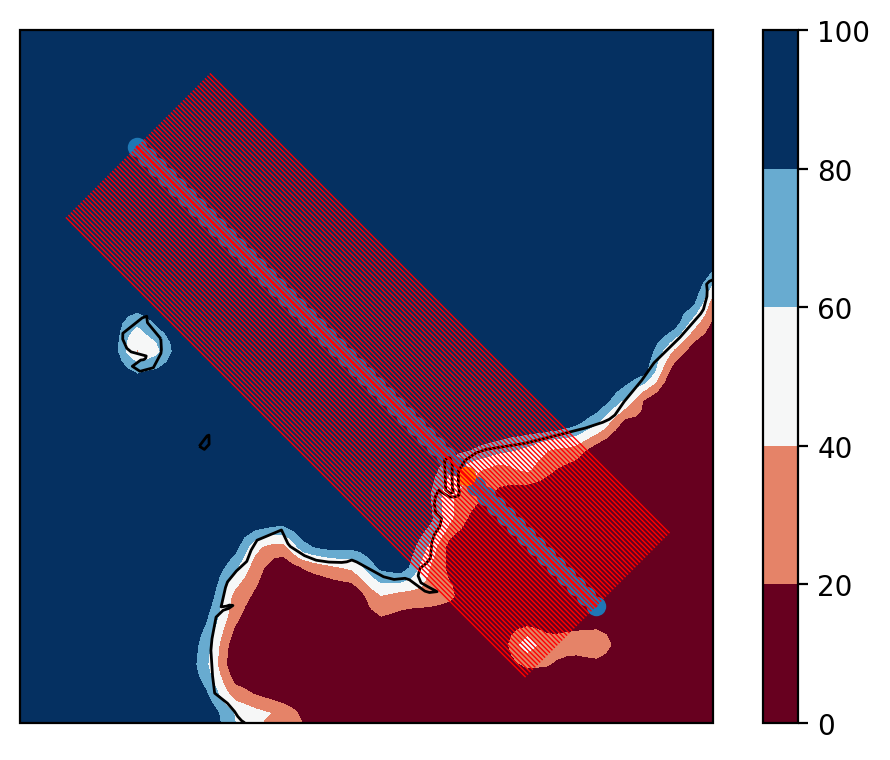

In [114]:
fig = plt.figure(figsize=(6.5,4.5))
gs = gridspec.GridSpec(nrows=1, ncols=1, hspace=0.075)

# d02_coords = dict(
#     south_north=('south_north',ds_d02.XLAT[0,:,0].values),
#     west_east=('west_east',ds_d02.XLONG[0,0,:].values)
#     )
# # # Terrain Height    [m]
# da_d02_TOPO = ds_d02['HGT'].sel(Time=slice(1)).compute().squeeze()
# x = da_d02_TOPO.assign_coords(d02_coords)
width=0.75
lat = [all_line_coords3[0,...].max()+0.5,all_line_coords3[0,...].min()-0.5]
lon = [all_line_coords3[1,...].min()-0.5,all_line_coords3[1,...].max()+0.5]
# lat = [-2,-6]
# lon = [100,104]
# lat = np.add([-2,-6],0.2)
# lon = np.subtract([100,104],0.2)
# lat = np.add([0,-8],0.2)
# lon = np.subtract([98,106],0.2)
# Yokoi et al. 2017-2019 domain:
x = da_Mask_IMERG_old[0,...]
x = x.sel(
	lat=slice(lat[1],lat[0]),
	lon=slice(lon[0],lon[1]))
# x = x.sel(
# 	south_north=slice(lat[1]-(width*1.5),lat[0]+(width*1.5)),
# 	west_east=slice(lon[0]-(width*1.5),lon[1]+(width*1.5)))
x_ticks = np.array([100,102,104])
x_tick_labels = [u'100\N{DEGREE SIGN}E',
                 u'102\N{DEGREE SIGN}E', u'104\N{DEGREE SIGN}E']
y_ticks = np.array([-6,-4,-2])
y_tick_labels = [u'6\N{DEGREE SIGN}S',
                 u'4\N{DEGREE SIGN}S', u'2\N{DEGREE SIGN}S']


# # Summatra domain:
# x = x.sel(
# 	south_north=slice(-7.5,7.5),
# 	west_east=slice(95,105))
# x_ticks = np.array([95,100,105])
# x_tick_labels = [u'95\N{DEGREE SIGN}E',
#                  u'100\N{DEGREE SIGN}E', u'105\N{DEGREE SIGN}E']
# y_ticks = np.array([-7.5,0,7.5])
# y_tick_labels = [u'7.5\N{DEGREE SIGN}S',
#                  u'0\N{DEGREE SIGN}N', u'7.5\N{DEGREE SIGN}N']
# lat = [5.5,-6.5]
# lon = [95.05,104.95]


ax1 = fig.add_subplot(gs[0,0],projection=ccrs.PlateCarree(central_longitude=0))
ax1.coastlines(linewidth=1, color='k', resolution='50m')  # cartopy function
cf1 = x.plot.contourf(
	cmap='RdBu',
	# cmap='gray',
	# levels=np.arange()
	# levels=np.arange(0,4250,250),
	# levels = np.append(0,np.logspace(0,3.65,50))
)
dx = 0.025
# plt.plot(lon,lat,'y')
# plt.plot(lon,lat[::-1],'r',linewidth=1)
for i in range(int(all_line_coords3.shape[2])):
	# plt.plot(np.subtract(lon,i*dx),np.add(lat[::-1],i*dx),'r',linewidth=0.5)
	# plt.plot(np.add(lon,i*dx),np.subtract(lat[::-1],i*dx),'r',linewidth=0.5)
	plt.plot(all_line_coords3[1,:,i],all_line_coords3[0,:,i],'r',linewidth=0.5)
	# plt.plot(np.add(lon,i*dx),np.subtract(lat[::-1],i*dx),'r',linewidth=0.5)
plt.plot(all_line_coords3[1,:,int(all_line_coords3.shape[2]/2)],all_line_coords3[0,:,int(all_line_coords3.shape[2]/2)],'r',linewidth=1)
plt.scatter(all_line_coords3[1,:,int(all_line_coords3.shape[2]/2)],all_line_coords3[0,:,int(all_line_coords3.shape[2]/2)])
# Plot where you think the coastline will be
plt.scatter(all_line_coords3[1,13,int(all_line_coords3.shape[2]/2)],all_line_coords3[0,13,int(all_line_coords3.shape[2]/2)])



ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')
ax1.set_title('')
# ax1.set_xticks(x_ticks)
# ax1.set_xticklabels(x_tick_labels)
# ax1.set_yticks(y_ticks)
# ax1.set_yticklabels(y_tick_labels)


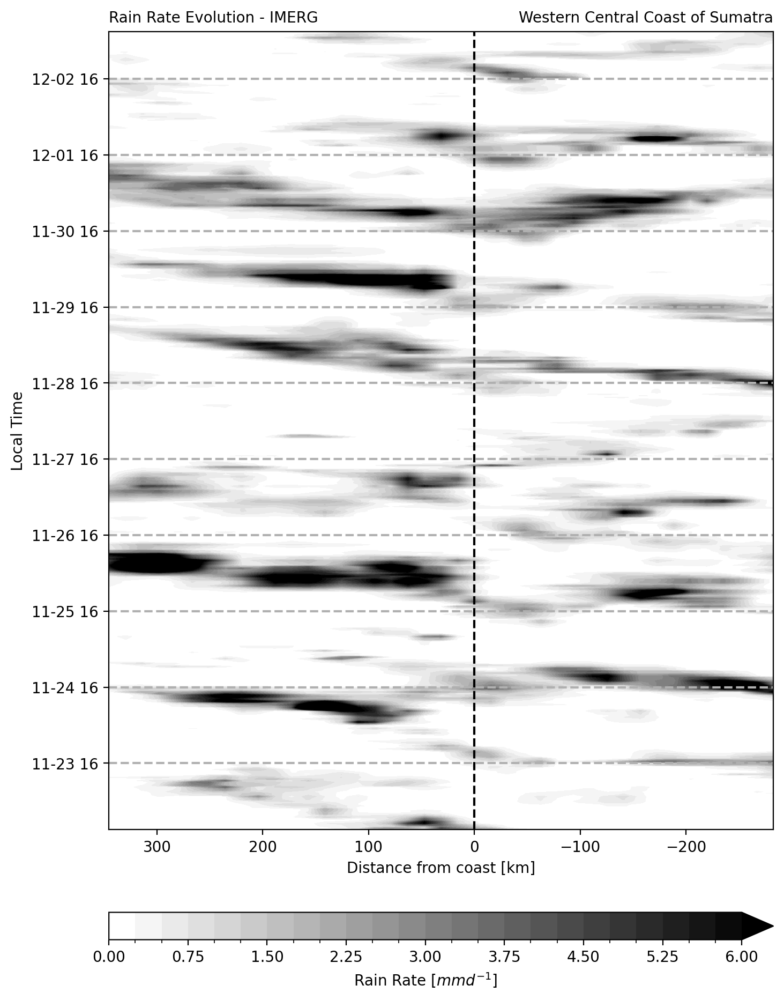

In [105]:
fig = plt.figure(figsize=(8,11))
gs = gridspec.GridSpec(nrows=2, ncols=1, hspace=0.2, height_ratios=[0.875,0.03])
ax1 = fig.add_subplot(gs[0,0])

# Data
	# Average over each cross-section
x1 = da_d01_RR_cross
x1 = x1.assign_coords({'Time':x1.Time + np.timedelta64(7,'h')})
x1 = x1.mean('Spread')

# Plot the cross-sectional data
cf1 = x1.plot.contourf(
	ax=ax1,
	x = 'Distance',
    y = 'Time',
	add_colorbar=False,
	levels=np.arange(0,6.25,0.25),
	# levels=np.append(0,np.logspace(0,0.9,20)),
	cmap='gray_r',
	center=0,
)


# Plot the vertical line at approximate coastline
plt.axvline(x=0, color='k', linestyle='--')
ax1.set_xlabel('Distance from coast [km]')
ax1.set_ylabel('Local Time')
ax1.invert_xaxis()
ax1.set_yticks(x1.Time[42::48].values)
ax1.set_yticklabels(x1.Time[42::48].dt.strftime("%m-%d %H").values)
# Set titles/labels
ax1.set_title('Rain Rate Evolution - IMERG', loc='left', fontsize=10)
ax1.set_title('Western Central Coast of Sumatra', loc='right', fontsize=10)
ax1.set_title('', loc='center')
# Create grids
# ax1.grid(linestyle='--', axis='x', linewidth=1.5)
ax1.grid(linestyle='--', axis='y', linewidth=1.5)

# Plot the colorbar
	# Rain rate colorbar
ax2 = fig.add_subplot(gs[1, 0])
cbar = plt.colorbar(cf1, cax=ax2, orientation='horizontal', pad=0 , aspect=100, extend='max')
cbar.set_label('Rain Rate [$mm d^{-1}$]')


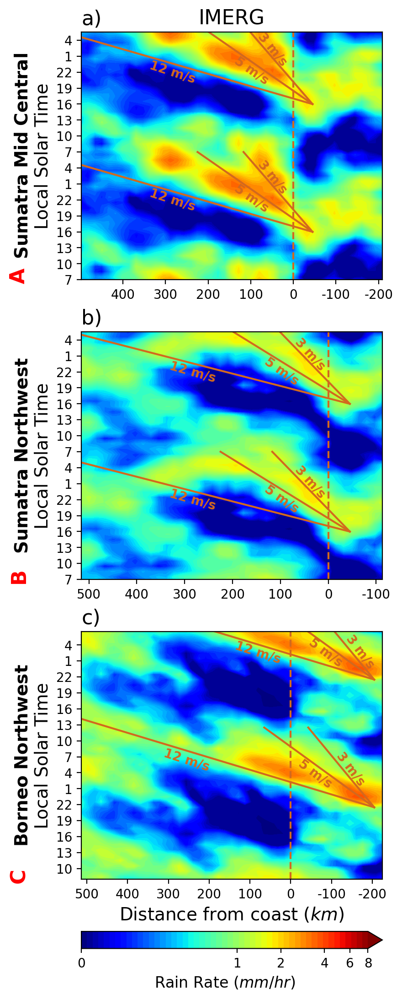

In [137]:
fig = plt.figure(figsize=(4.25,13))
gs = gridspec.GridSpec(nrows=4, ncols=1, hspace=0.275, height_ratios=[0.29,.29,.29,0.02])
ax1 = fig.add_subplot(gs[0,0])
ax2 = fig.add_subplot(gs[1,0])
ax3 = fig.add_subplot(gs[2,0])

fs =16

levs = np.concatenate(([0],[0.01],np.logspace(np.log10(.1), np.log10(8), num=50)))

# Mid-central Sumatra
# Data
	# Composite diurnally, and then average over each cross-section
x1 = da_RR_cross1[:407]
# Switch to local time
# x1 = x1.assign_coords({'Time':x1.Time + np.timedelta64(7,'h')})
x1 = x1.groupby('Time.hour').mean().mean('Spread')
# Concat to make a more continuous plot
x1 = xr.concat([x1,x1],dim='hour',data_vars='all')
# x1 = xr.concat([x1.isel(hour=slice(18,24)),x1,x1.isel(hour=slice(0,6))],dim='hour',data_vars='all')
yticks = x1.hour.values
x1 = x1.assign_coords(hour=(['hour'],np.arange(-0.5,47.5)))

# Northwest Sumatra
# Data
	# Composite diurnally, and then average over each cross-section
x2 = da_RR_cross2[:407]
# Switch to local time
# x2 = x2.assign_coords({'Time':x2.Time + np.timedelta64(7,'h')})
x2 = x2.groupby('Time.hour').mean().mean('Spread')
# Concat to make a more continuous plot
x2 = xr.concat([x2,x2],dim='hour',data_vars='all')
yticks = x2.hour.values
x2 = x2.assign_coords(hour=(['hour'],np.arange(-0.5,47.5)))

# Northwest Borneo
# Data
	# Composite diurnally, and then average over each cross-section
x3 = da_RR_cross3[:407]
# Switch to local time
# x3 = x3.assign_coords({'Time':x3.Time + np.timedelta64(8,'h')})
x3 = x3.groupby('Time.hour').mean().mean('Spread')
# Concat to make a more continuous plot
x3 = xr.concat([x3,x3],dim='hour',data_vars='all')
yticks = x3.hour.values
x3 = x3.assign_coords(hour=(['hour'],np.arange(-0.5,47.5)))

# Plot the cross-sectional data
cf1 = x1.plot.contourf(
	ax=ax1,
	x = 'Distance',
    y = 'hour',
	add_colorbar=False,
	levels=levs,
	cmap='jet',
	extend='max',
)

# Plot the cross-sectional data
cf2 = x2.plot.contourf(
	ax=ax2,
	x = 'Distance',
    y = 'hour',
	add_colorbar=False,
	levels=levs,
	cmap='jet',
	extend='max',
)

# Plot the cross-sectional data
cf3 = x3.plot.contourf(
	ax=ax3,
	x = 'Distance',
    y = 'hour',
	add_colorbar=False,
	levels=levs,
	cmap='jet',
	extend='max',
)


# Sumatra Mid Central phase speed lines
ax1.plot([-45,117],[9,24] , color='chocolate')
ax1.text(60, 18.5, '3 m/s', color='chocolate', weight='bold',fontsize=fs-6, rotation=-51, rotation_mode='anchor', horizontalalignment='center', verticalalignment='bottom')
ax1.plot([-45,225],[9,24] , color='chocolate')
ax1.text(90, 16.25, '5 m/s', color='chocolate', weight='bold',fontsize=fs-6, rotation=-35, rotation_mode='anchor', horizontalalignment='center', verticalalignment='top')
ax1.plot([-45,603],[9,24] , color='chocolate')
ax1.text(279, 16.1, '12 m/s', color='chocolate', weight='bold',fontsize=fs-6, rotation=-18, rotation_mode='anchor', horizontalalignment='center', verticalalignment='top')

ax1.plot([-45,117],[33,48] , color='chocolate')
ax1.text(60, 42.5, '3 m/s', color='chocolate', weight='bold',fontsize=fs-6, rotation=-51, rotation_mode='anchor', horizontalalignment='center', verticalalignment='bottom')
ax1.plot([-45,225],[33,48] , color='chocolate')
ax1.text(90, 40.25, '5 m/s', color='chocolate', weight='bold',fontsize=fs-6, rotation=-35, rotation_mode='anchor', horizontalalignment='center', verticalalignment='top')
ax1.plot([-45,603],[33,48] , color='chocolate')
ax1.text(279, 40.1, '12 m/s', color='chocolate', weight='bold',fontsize=fs-6, rotation=-18, rotation_mode='anchor', horizontalalignment='center', verticalalignment='top')

# Sumatra Northwest phase speed lines
ax2.plot([-45,117],[9,24] , color='chocolate')
ax2.text(48, 17.5, '3 m/s', color='chocolate', weight='bold',fontsize=fs-6, rotation=-48, rotation_mode='anchor', horizontalalignment='center', verticalalignment='bottom')
ax2.plot([-45,225],[9,24] , color='chocolate')
ax2.text(90, 16.1, '5 m/s', color='chocolate', weight='bold',fontsize=fs-6, rotation=-35, rotation_mode='anchor', horizontalalignment='center', verticalalignment='top')
ax2.plot([-45,603],[9,24] , color='chocolate')
ax2.text(279, 16.1, '12 m/s', color='chocolate', weight='bold',fontsize=fs-6, rotation=-16, rotation_mode='anchor', horizontalalignment='center', verticalalignment='top')

ax2.plot([-45,117],[33,48] , color='chocolate')
ax2.text(48, 41.5, '3 m/s', color='chocolate', weight='bold',fontsize=fs-6, rotation=-48, rotation_mode='anchor', horizontalalignment='center', verticalalignment='bottom')
ax2.plot([-45,225],[33,48] , color='chocolate')
ax2.text(90, 40.1, '5 m/s', color='chocolate', weight='bold',fontsize=fs-6, rotation=-35, rotation_mode='anchor', horizontalalignment='center', verticalalignment='top')
ax2.plot([-45,603],[33,48] , color='chocolate')
ax2.text(279, 40.1, '12 m/s', color='chocolate', weight='bold',fontsize=fs-6, rotation=-16, rotation_mode='anchor', horizontalalignment='center', verticalalignment='top')

# Borneo North West phase speed lines
ax3.plot([-205,-43],[13.5,28.5] , color='chocolate')
ax3.text(-135, 20, '3 m/s', color='chocolate', weight='bold',fontsize=fs-6, rotation=-53, rotation_mode='anchor', horizontalalignment='center', verticalalignment='bottom')
ax3.plot([-205,65],[13.5,28.5] , color='chocolate')
ax3.text(-70, 20.75, '5 m/s', color='chocolate', weight='bold',fontsize=fs-6, rotation=-37, rotation_mode='anchor', horizontalalignment='center', verticalalignment='top')
ax3.plot([-205,530],[13.5,30.5] , color='chocolate')
ax3.text(250, 23.5, '12 m/s', color='chocolate', weight='bold',fontsize=fs-6, rotation=-18, rotation_mode='anchor', horizontalalignment='center', verticalalignment='top')

ax3.plot([-205,-43],[37.5,52.5] , color='chocolate')
ax3.text(-158, 42, '3 m/s', color='chocolate', weight='bold',fontsize=fs-6, rotation=-53, rotation_mode='anchor', horizontalalignment='center', verticalalignment='bottom')
ax3.plot([-205,65],[37.5,52.5] , color='chocolate')
ax3.text(-95, 43.5, '5 m/s', color='chocolate', weight='bold',fontsize=fs-6, rotation=-37, rotation_mode='anchor', horizontalalignment='center', verticalalignment='top')
ax3.plot([-205,530],[37.5,54.5] , color='chocolate')
ax3.text(75, 43.7, '12 m/s', color='chocolate', weight='bold',fontsize=fs-6, rotation=-18, rotation_mode='anchor', horizontalalignment='center', verticalalignment='top')

ax1.axvline(x=0, color='chocolate', linestyle='--')
ax2.axvline(x=0, color='chocolate', linestyle='--')
ax3.axvline(x=0, color='chocolate', linestyle='--')

ax1.set_xlabel('')
ax2.set_xlabel('')
ax3.set_xlabel('Distance from coast ($km$)', fontsize=fs-2)
line1 = r'$\bf{Sumatra\ Mid\ Central}$'
line2 = 'Local Solar Time'
ax1.set_ylabel(f'{line1}\n{line2}', fontsize=fs-2)
ax1.annotate("A", xy=(-0.24, 0), xycoords='axes fraction', fontsize=fs, color="red", fontweight="bold", rotation=90)
line1 = r'$\bf{Sumatra\ Northwest}$'
ax2.set_ylabel(f'{line1}\n{line2}', fontsize=fs-2)
ax2.annotate("B", xy=(-0.24, 0), xycoords='axes fraction', fontsize=fs, color="red", fontweight="bold", rotation=90)
line1 = r'$\bf{Borneo\ Northwest}$'
ax3.set_ylabel(f'{line1}\n{line2}', fontsize=fs-2)
ax3.annotate("C", xy=(-0.24, 0), xycoords='axes fraction', fontsize=fs, color="red", fontweight="bold", rotation=90)

ax1.set_xticks(np.arange(-200,600,100))
ax2.set_xticks(np.arange(-200,600,100))
ax3.set_xticks(np.arange(-200,600,100))
ax1.set_yticks(x1.hour[0::3].values+0.5)
ax2.set_yticks(x2.hour[0::3].values+0.5)
ax3.set_yticks(x3.hour[0::3].values+0.5-1)
ax1.set_xticklabels(np.arange(-200,600,100),fontsize=fs-6)
ax2.set_xticklabels(np.arange(-200,600,100),fontsize=fs-6)
ax3.set_xticklabels(np.arange(-200,600,100),fontsize=fs-6)
ax1.set_yticklabels(np.concatenate((np.arange(7,25,3),np.arange(1,25,3),np.arange(1,7,3))),fontsize=fs-6)
ax2.set_yticklabels(np.concatenate((np.arange(7,25,3),np.arange(1,25,3),np.arange(1,7,3))),fontsize=fs-6)
ax3.set_yticklabels(np.concatenate((np.arange(7,25,3),np.arange(1,25,3),np.arange(1,7,3))),fontsize=fs-6)
ax1.set_title('IMERG', loc='center', fontsize=fs)
ax1.set_title('a)', loc='left', fontsize=fs)
ax2.set_title('b)', loc='left', fontsize=fs)
ax3.set_title('c)', loc='left', fontsize=fs)
ax1.set_xlim([x1.Distance[0],x1.Distance[-1]])
ax2.set_xlim([x2.Distance[0],x2.Distance[-1]])
ax3.set_xlim([x3.Distance[0],x3.Distance[-1]])
ax1.set_ylim([0,46.5])
ax2.set_ylim([0,46.5])
ax3.set_ylim([0,46.5])
ax1.invert_xaxis()
ax2.invert_xaxis()
ax3.invert_xaxis()


# Plot the colorbar
	# Rain rate colorbar
ax4 = fig.add_subplot(gs[3, 0])
cbar = plt.colorbar(cf1, cax=ax4, orientation='horizontal', pad=0 , aspect=100)
cbar.set_label('Rain Rate ($mm/hr$)', fontsize=fs-4)
cbar_ticks = np.concatenate(([0],[1],np.arange(2,9,2)))
cbar.set_ticks(cbar_ticks)
cbar.minorticks_off()
cbar.set_ticklabels(cbar_ticks, fontsize=fs-6)
